## Exploring RevelioLabs Data
Here we are doing an exploratory analysis on data downloaded from : <a href="https://info0.s3.us-east-2.amazonaws.com/assignments/202110/assignments_202110_long_file000.tar.gz">Link</a></br>

### About the dataset: 
Long file: This file contains counts, inflows, outflows and sum of salaries for different
granularities, i.e. different groups of the data (e.g. in a given month,for a company,
position and gender etc..)

### EndGoal:

The final output should include three items:<br>
<ul>
<li>A very short analysis in the style of one of RevelioLabs' newsletters. This should
include a catchy subject line and be interesting and simple enough for a broad
    audience.</li>
<li>A slightly deeper analysis of the same thing. This version should not be
written out in words, but have the charts that you'd want to include if you were to
write a 5-page extension, along with some notes about why you think it's interesting.</li>
<li>A jupyter notebook with your code that you used to do the analysis.</li>
   </ul>
Notes:
<ul>
<li>The analysis should all be in python.</li>
<li>It will be challenging to keep things short, but it is important. The simpler
the better!</li>
<li>Even though there will be several datasets, you should not feel the need to
use more than one file, unless it really helps your analysis.</li>
    </ul>
    
##### Author: <a href="mailto:gopalkmr19@gmail.com">Gopal Kumar</a> 

### Here we go! 

In [1]:
# Importing modules and packages
import pandas as pd
import os
import matplotlib
import plotly.express as px

In [2]:
#Defining a color palette just in case
import seaborn as sns
pal = sns.color_palette("tab10")

/Users/gopal/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
from IPython.display import display
pd.options.display.max_columns = None

In [4]:
# Fetching files
folder_name = "//assignments_202110_long_file000//" #unzipping the zip file in the same directory as of the notebooks'
req_files = os.listdir(os.getcwd()+folder_name) #reading all individual long files in the zip folder

In [5]:
len(req_files)

32

In [6]:
req_files

['assignment_202110_long_file_0030_part_00',
 'assignment_202110_long_file_0020_part_00',
 'assignment_202110_long_file_0029_part_00',
 'assignment_202110_long_file_0016_part_00',
 'assignment_202110_long_file_0006_part_00',
 'assignment_202110_long_file_0028_part_00',
 'assignment_202110_long_file_0007_part_00',
 'assignment_202110_long_file_0017_part_00',
 'assignment_202110_long_file_0021_part_00',
 'assignment_202110_long_file_0031_part_00',
 'assignment_202110_long_file_0015_part_00',
 'assignment_202110_long_file_0005_part_00',
 'assignment_202110_long_file_0023_part_00',
 'assignment_202110_long_file_0022_part_00',
 'assignment_202110_long_file_0004_part_00',
 'assignment_202110_long_file_0014_part_00',
 'assignment_202110_long_file_0011_part_00',
 'assignment_202110_long_file_0001_part_00',
 'assignment_202110_long_file_0008_part_00',
 'assignment_202110_long_file_0018_part_00',
 'assignment_202110_long_file_0027_part_00',
 'assignment_202110_long_file_0019_part_00',
 'assignme

In [7]:
# Testing a sample file
df = pd.read_csv(os.getcwd()+folder_name+req_files[0])

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 331600 entries, 0 to 331599
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   month         331600 non-null  object 
 1   company       331600 non-null  object 
 2   region        331600 non-null  object 
 3   job_category  331600 non-null  object 
 4   seniority     331600 non-null  int64  
 5   gender        331600 non-null  object 
 6   role_k50      331600 non-null  object 
 7   count         331600 non-null  float64
 8   inflow        331600 non-null  float64
 9   outflow       331600 non-null  float64
 10  salary        287552 non-null  float64
dtypes: float64(4), int64(1), object(6)
memory usage: 27.8+ MB


In [9]:
#Now loading all files
dfs = []
for item in req_files:
    df = pd.read_csv(os.getcwd()+folder_name+item)
    df = df.dropna(how='all').drop_duplicates()
    dfs.append(df)
    

In [10]:
df = pd.concat(dfs,axis=0)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10598940 entries, 0 to 330994
Data columns (total 11 columns):
 #   Column        Dtype  
---  ------        -----  
 0   month         object 
 1   company       object 
 2   region        object 
 3   job_category  object 
 4   seniority     int64  
 5   gender        object 
 6   role_k50      object 
 7   count         float64
 8   inflow        float64
 9   outflow       float64
 10  salary        float64
dtypes: float64(4), int64(1), object(6)
memory usage: 970.4+ MB


In [12]:
# Checking unique values for identifiers

In [13]:
print(list(df.company.unique()))

['GlaxoSmithKline PLC', 'Merck & Co.\\, Inc.', 'Moderna Therapeutics\\, Inc.', 'Abbott Laboratories', 'Eli Lilly and Co', 'Roche Holding AG', 'Pfizer Inc', 'Biogen Inc', 'Johnson & Johnson', 'Novartis AG', 'AstraZeneca PLC', 'Bayer AG', 'Regeneron Pharmaceuticals Inc']


In [14]:
print(list(df.region.unique()))

['Arab States', 'Central America and the Caribbean', 'Eastern Asia', 'Central and Western Asia', 'Eastern Europe', 'Northern America', 'Northern Africa', 'Pacific Islands', 'South America', 'Southern Europe', 'Sub-Saharan Africa', 'Northern Europe', 'Western Europe', 'South-Eastern Asia', 'Southern Asia', 'empty']


In [15]:
print(list(df.job_category.unique()))

['Admin', 'Finance', 'Operations', 'Engineer', 'Sales', 'Scientist', 'Marketing', 'empty']


In [16]:
print(list(df.seniority.unique()))

[1, 2, 3, 4]


In [17]:
print(list(df.gender.unique()))

['male', 'female']


In [18]:
print(list(df.role_k50.unique()))

['Coordinator', 'Human Resources Specialist', 'Accountant', 'Legal', 'Operations Administrator', 'Operations Manager', 'Quality Assurance', 'Recruiter', 'Retail Sales', 'Sales Representative', 'Application Engineer', 'Sales Associate', 'IT Project Manager', 'Technician', 'Mechanical Engineer', 'Technical Architect', 'Software Engineer', 'Sustainability Specialist', 'IT Specialist', 'Production Operator', 'Delivery Manager', 'Clinical Research Associate', 'Machine Operator', 'Cashier', 'Logistics', 'Claims Specialist', 'QA Tester', 'Financial Advisor', 'Investment Specialist', 'Geologist', 'Data Analyst', 'Distribution Specialist', 'Marketing', 'Billing Specialist', 'Designer', 'Project Manager', 'Infrastructure Engineer', 'Crew Member', 'Scientist', 'Receptionist', 'Producer', 'Solutions Specialist', 'Merchandiser', 'Customer Service', 'Development Manager', 'Client Services', 'Medical Rep', 'Product Manager', 'Business Operations', 'Communications Specialist', 'empty']


In [19]:
# Checking df
df

,month,company,region,job_category,seniority,gender,role_k50,count,inflow,outflow,salary
0,2008-02,GlaxoSmithKline PLC,Arab States,Admin,1,male,Coordinator,1.743000,0.00,0.0,11791.137296
1,2008-12,GlaxoSmithKline PLC,Arab States,Admin,1,male,Coordinator,1.742944,0.00,0.0,11930.239139
2,2010-10,GlaxoSmithKline PLC,Arab States,Admin,1,male,Coordinator,1.743955,0.00,0.0,12246.115796
3,2014-04,GlaxoSmithKline PLC,Arab States,Admin,1,male,Coordinator,5.440985,0.00,0.0,14174.153892
4,2015-10,GlaxoSmithKline PLC,Arab States,Admin,1,male,Coordinator,3.704985,0.00,0.0,9345.199119
...,...,...,...,...,...,...,...,...,...,...,...
330990,2015-03,Pfizer Inc,empty,Scientist,4,female,Clinical Research Associate,11.247536,0.00,0.0,222352.387170
330991,2016-08,Pfizer Inc,empty,Scientist,4,female,Clinical Research Associate,8.641998,0.00,0.0,168524.286855
330992,2018-11,Pfizer Inc,empty,Scientist,4,female,Clinical Research Associate,9.251244,0.00,0.0,186716.020385
330993,2020-07,Pfizer Inc,empty,Scientist,4,female,Clinical Research Associate,7.870028,0.62,0.0,160213.606132


### Charts

We are not adjusting seasonality in these charts. This is mainly because of resource constraints (tools like Eviews); although it can be done using different methods in python as well but it will take some time to implement these seasonal adjustment methods. To smoothen curve over time, we are taking a six month rolling mean of the series.

In [20]:
#First making line charts with 'month' variable

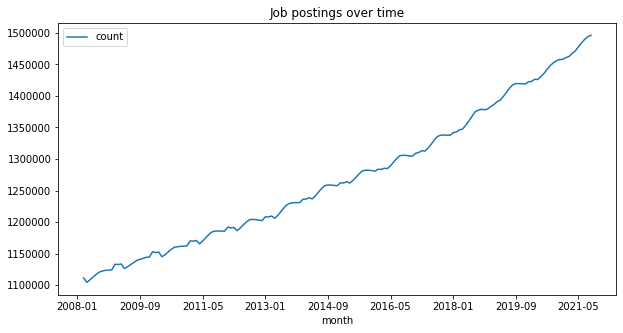

In [21]:
# Total job posting count over time
y = df.copy()
y = df.groupby(['month'])[['count']].sum()
y = y[['count']]
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job postings over time")

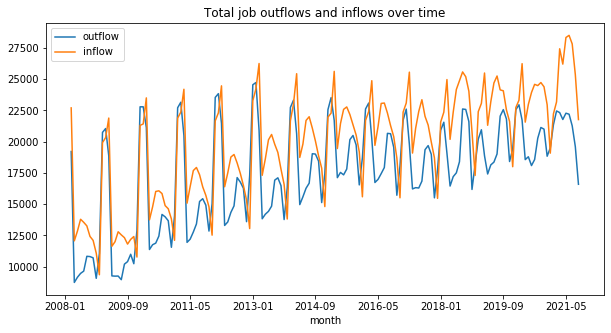

In [22]:
# Total job outflows and inflows over time
y = df.copy()
y = df.groupby(['month'])[['outflow','inflow']].sum()
y = y[['outflow','inflow']]
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Total job outflows and inflows over time")

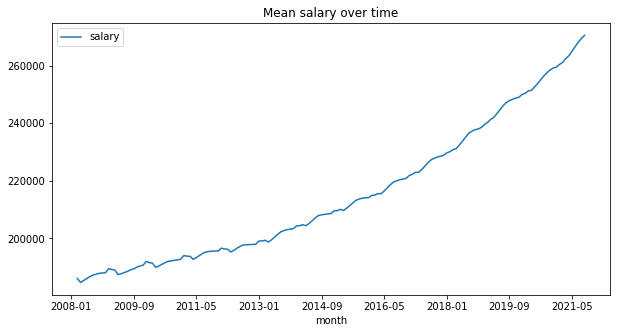

In [23]:
# Mean salary over time
y = df.copy()
y = y[~y.salary.isnull()] #Dropping rows where salary is not present
y = y.groupby(['month'])[['salary']].mean()
y = y[['salary']]
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary over time")

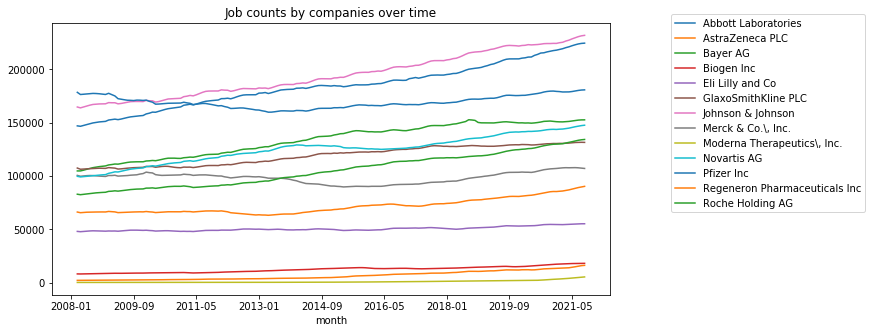

In [24]:
# Job counts by companies over time
y = df.copy()
y = y.groupby(['month','company'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='company',values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job counts by companies over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

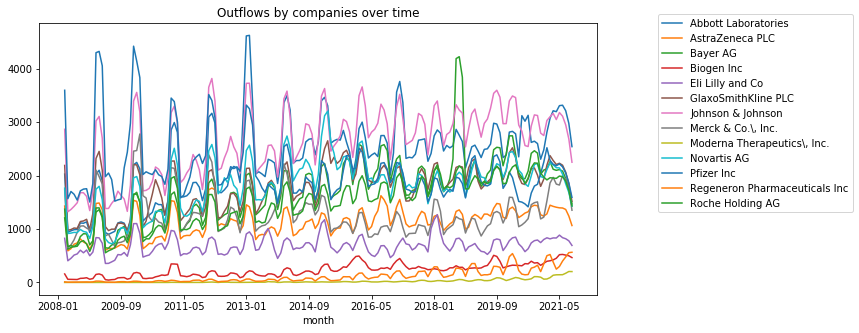

In [25]:
# Outflows by companies over time
y = df.copy()
y = y.groupby(['month','company'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='company',values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by companies over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

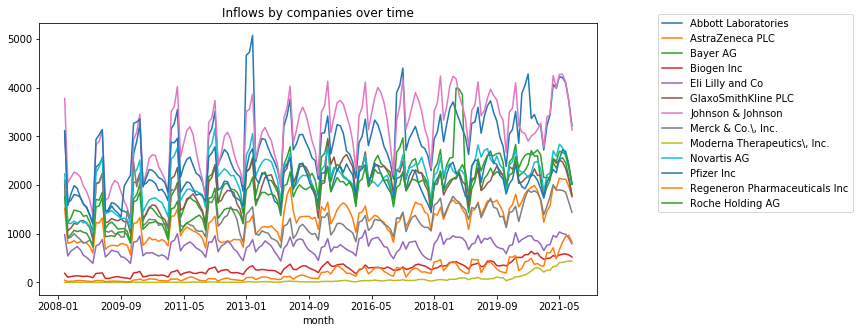

In [26]:
# Inflows by companies over time
y = df.copy()
y = y.groupby(['month','company'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='company',values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by companies over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

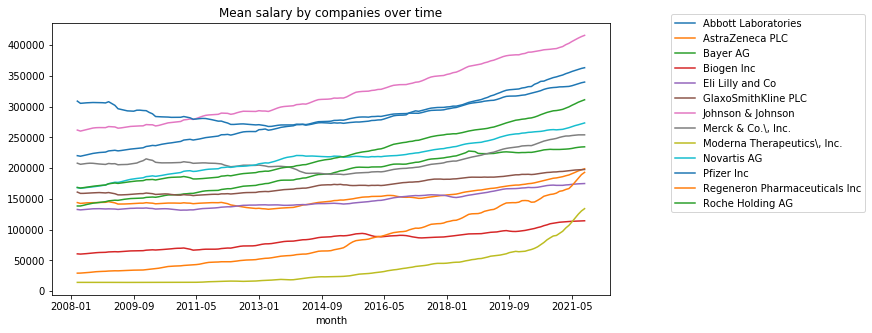

In [27]:
# Mean salary by companies over time
y = df.copy()
y = y.groupby(['month','company'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns='company',values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by companies over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

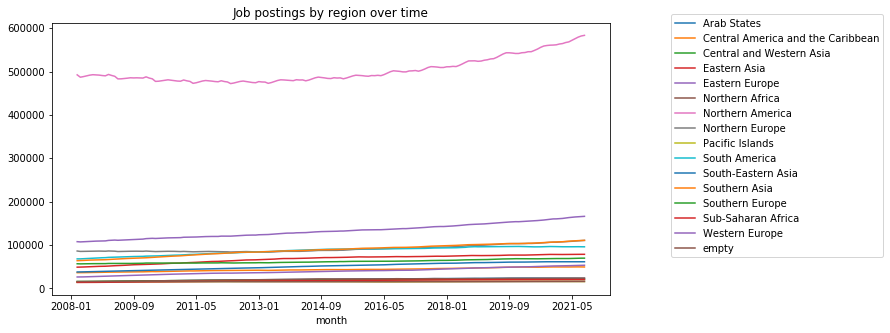

In [28]:
#Job postings by region over time
y = df.copy()
y = y.groupby(['month','region'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='region',values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job postings by region over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

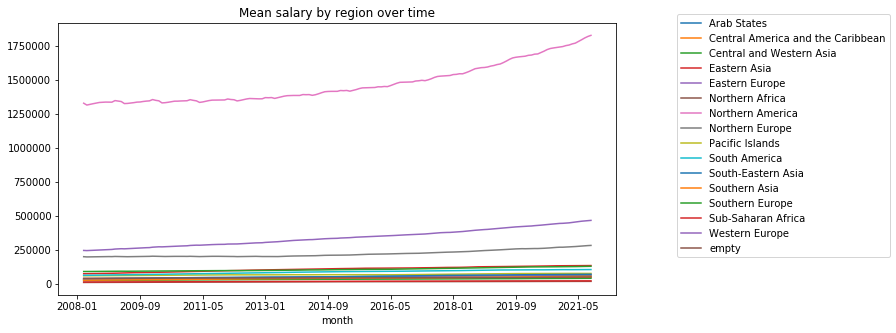

In [29]:
#Job postings by region over time
y = df.copy()
y = y.groupby(['month','region'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns='region',values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by region over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

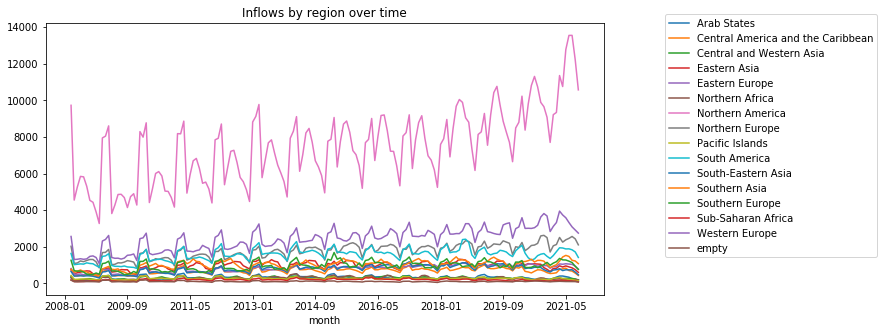

In [30]:
# Inflows by region over time
y = df.copy()
y = y.groupby(['month','region'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='region',values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by region over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

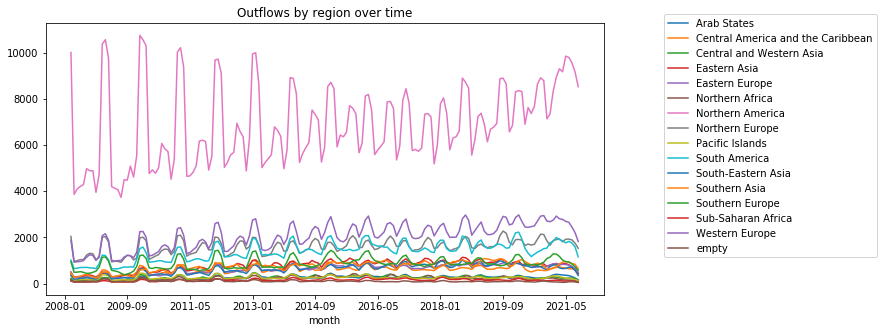

In [31]:
# Outflows by region over time
y = df.copy()
y = y.groupby(['month','region'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='region',values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by region over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

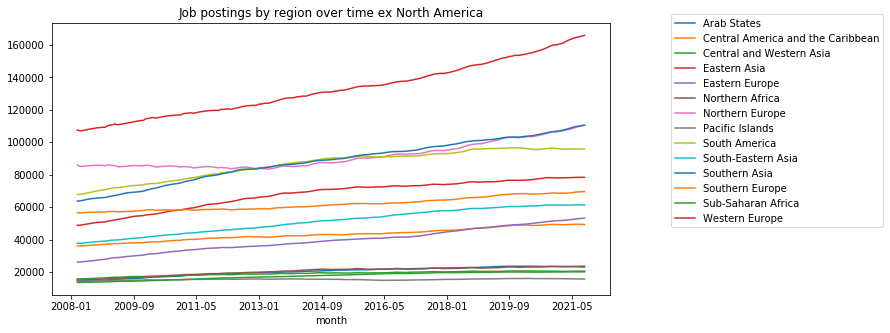

In [32]:
#Job postings by region over time
y = df.copy()
y = y.groupby(['month','region'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='region',values='count')
cols = list(y.columns)
cols.remove('Northern America')
cols.remove('empty')
y = y [cols]
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job postings by region over time ex North America")
ax.legend(bbox_to_anchor=(1.1, 1.05))

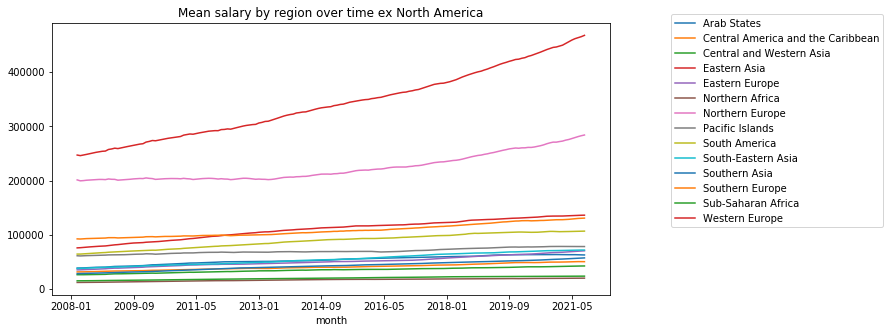

In [33]:
#Job postings by region over time
y1 = df.copy()
y1 = df.groupby(['month','region'])['salary'].mean()
y1 = y1.reset_index()
y1 = y1.pivot_table(index='month',columns='region',values='salary')
cols = list(y1.columns)
cols.remove('Northern America')
cols.remove('empty')
y1 = y1[cols]
y1 = y1.rolling(3).mean()
ax = y1.plot(figsize=(10,5),title="Mean salary by region over time ex North America")
ax.legend(bbox_to_anchor=(1.1, 1.05))

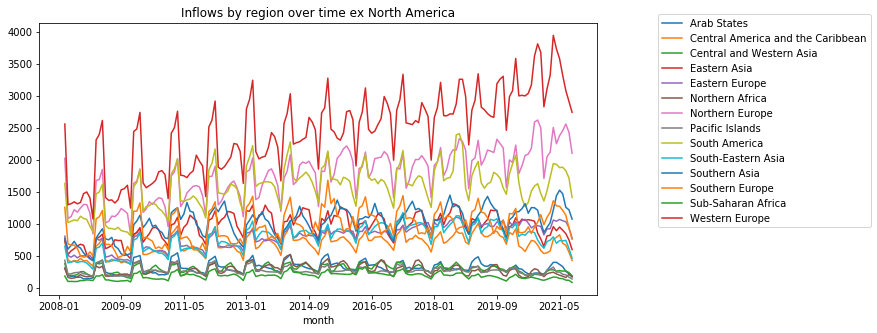

In [34]:
# Inflows by region over time ex North America
y = df.copy()
y = y.groupby(['month','region'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='region',values='inflow')
cols = list(y.columns)
cols.remove('Northern America')
cols.remove('empty')
y = y [cols]
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by region over time ex North America")
ax.legend(bbox_to_anchor=(1.1, 1.05))

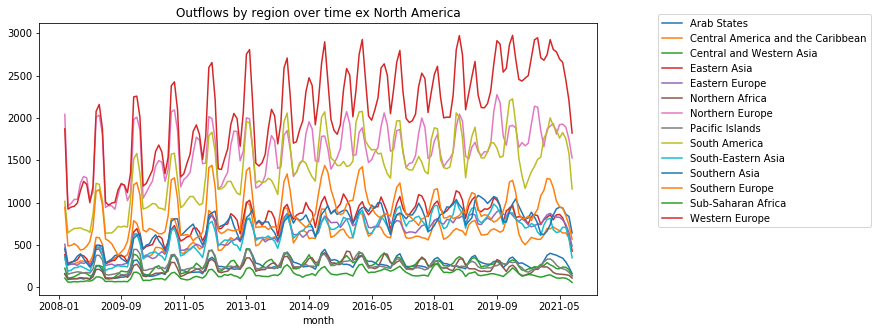

In [35]:
# Outflows by region over time ex North America
y = df.copy()
y = y.groupby(['month','region'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='region',values='outflow')
cols = list(y.columns)
cols.remove('Northern America')
cols.remove('empty')
y = y [cols]
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by region over time ex North America")
ax.legend(bbox_to_anchor=(1.1, 1.05))

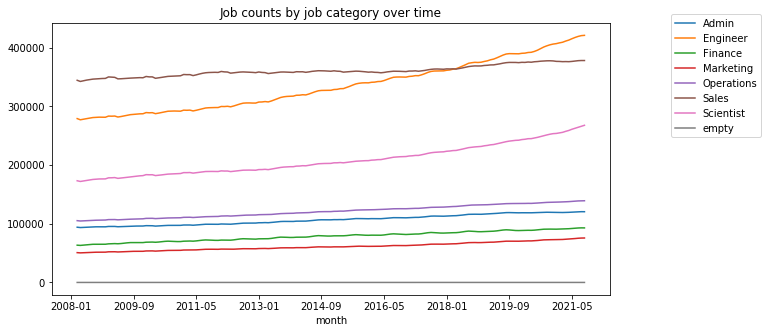

In [36]:
# Job counts by job category over time
y = df.copy()
y = y.groupby(['month','job_category'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='job_category',values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job counts by job category over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

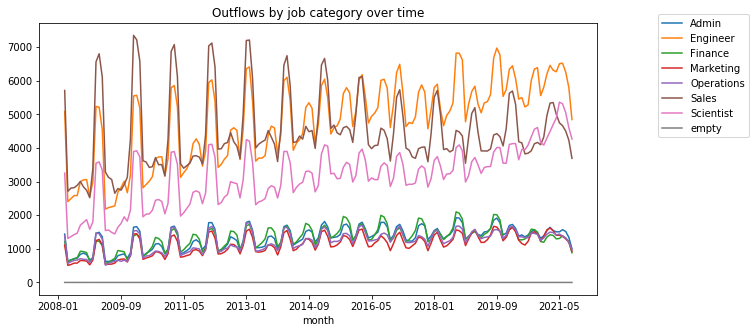

In [37]:
# Outflows by job category over time
y = df.copy()
y = y.groupby(['month','job_category'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='job_category',values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by job category over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

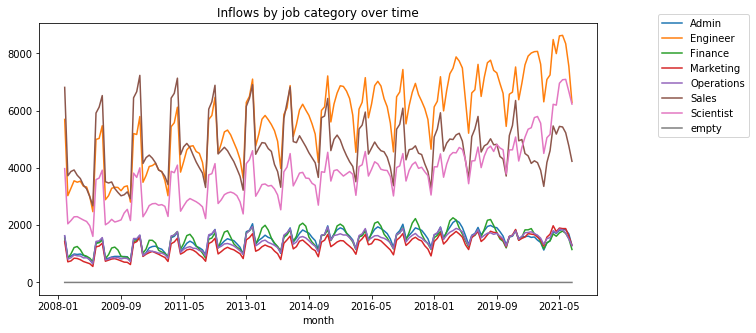

In [38]:
# Inflows by job category over time
y = df.copy()
y = y.groupby(['month','job_category'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='job_category',values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by job category over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

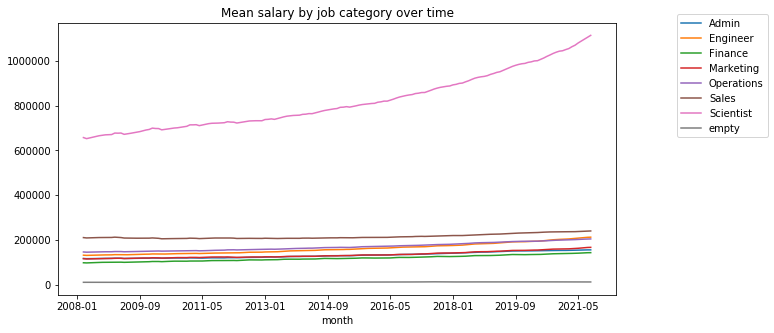

In [39]:
# Mean salary by job category over time
y = df.copy()
y = y.groupby(['month','job_category'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns='job_category',values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by job category over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

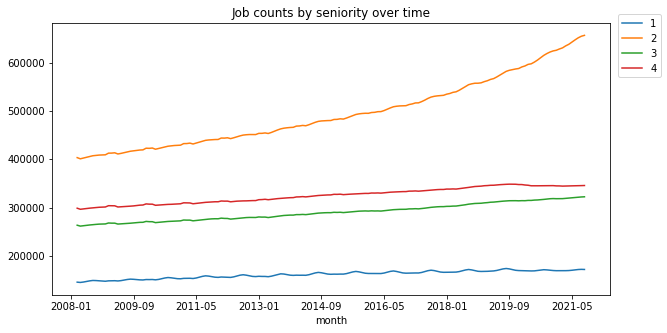

In [40]:
# Job counts by seniority over time
y = df.copy()
y = y.groupby(['month','seniority'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='seniority',values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job counts by seniority over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

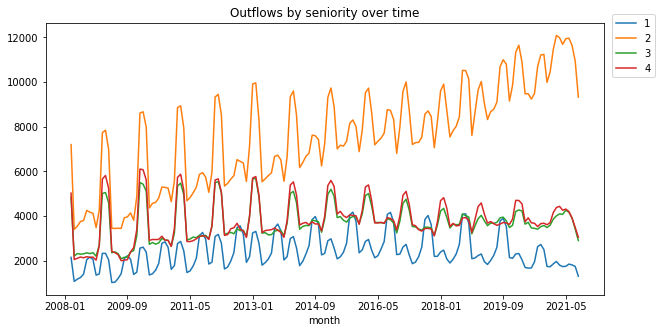

In [41]:
# Outflows by seniority over time
y = df.copy()
y = y.groupby(['month','seniority'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='seniority',values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by seniority over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

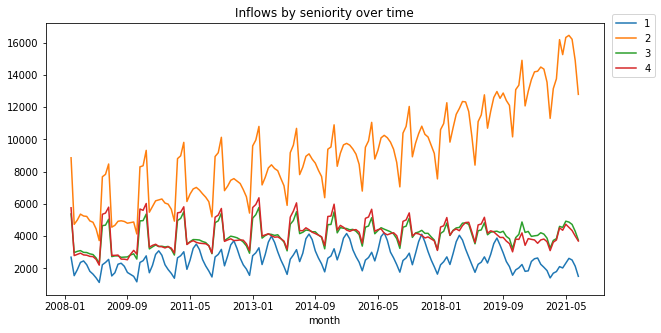

In [42]:
# Inflows by seniority over time
y = df.copy()
y = y.groupby(['month','seniority'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='seniority',values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by seniority over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

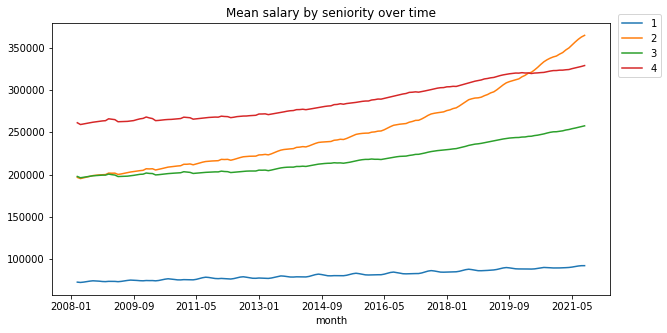

In [43]:
# Mean salary by seniority over time
y = df.copy()
y = y.groupby(['month','seniority'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns='seniority',values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by seniority over time")
ax.legend(bbox_to_anchor=(1.1, 1.05))

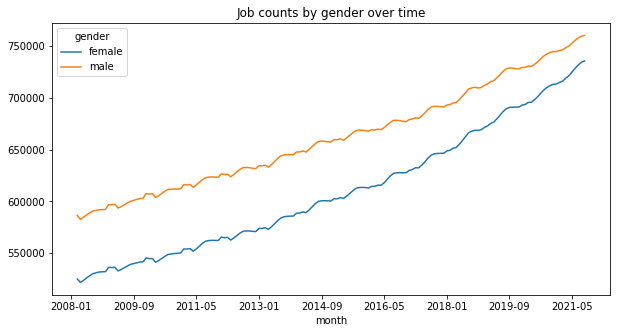

In [44]:
# Job counts by gender over time
y = df.copy()
y = y.groupby(['month','gender'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='gender',values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job counts by gender over time")

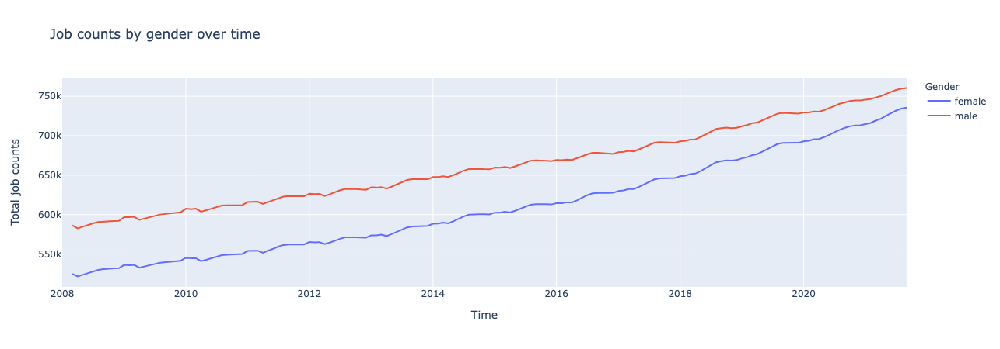

In [46]:
#Creating plotly chart for webpage
t = y.copy()
fig = px.line(t, x=t.index, y=['female','male'], title="Job counts by gender over time",
              labels={
                     "value": "Total job counts",
                     "variable": "Gender",
                      "month": "Time"
                 },)
fig.update_traces(
    hovertemplate="%{y} jobs in %{x}."
)
fig.show()
# plotly.offline.plot(fig, include_plotlyjs=False, output_type='div')
fig.write_html("test\\file1.html")

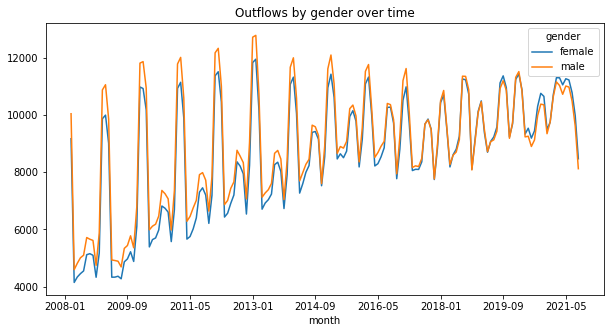

In [47]:
# Outflows by gender over time
y = df.copy()
y = y.groupby(['month','gender'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='gender',values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by gender over time")
# ax.legend(bbox_to_anchor=(1.1, 1.05))

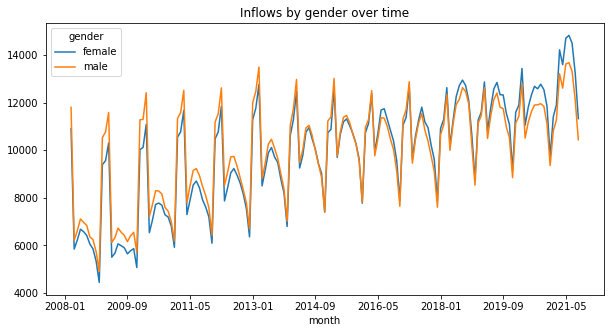

In [48]:
# Inflows by gender over time
y = df.copy()
y = y.groupby(['month','gender'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='gender',values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by gender over time")
# ax.legend(bbox_to_anchor=(1.1, 1.05))

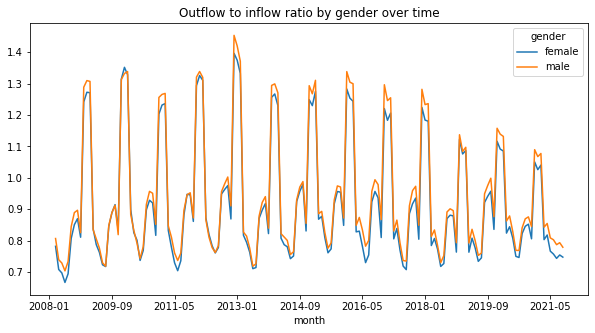

In [49]:
# Outflows-to-Inflow Ratio by gender over time
y = df.copy()
y = y.groupby(['month','gender'])[['outflow','inflow']].sum()
y['outflow_to_inflow'] = y['outflow']/y['inflow']
y = y[['outflow_to_inflow']]
y = y.reset_index()
y = y.pivot_table(index='month',columns='gender',values='outflow_to_inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflow to inflow ratio by gender over time")
# ax.legend(bbox_to_anchor=(1.1, 1.05))

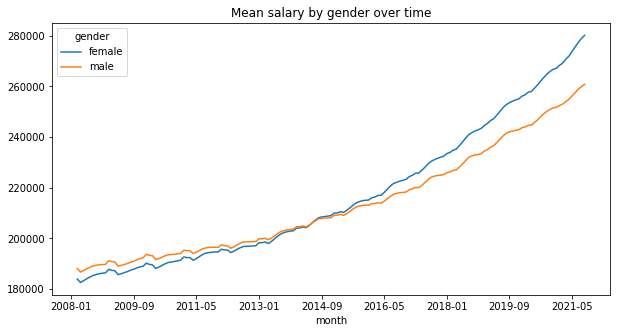

In [80]:
# Mean salary by gender over time
y = df.copy()
y = y.groupby(['month','gender'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns='gender',values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by gender over time")
# ax.legend(bbox_to_anchor=(1.1, 1.05))

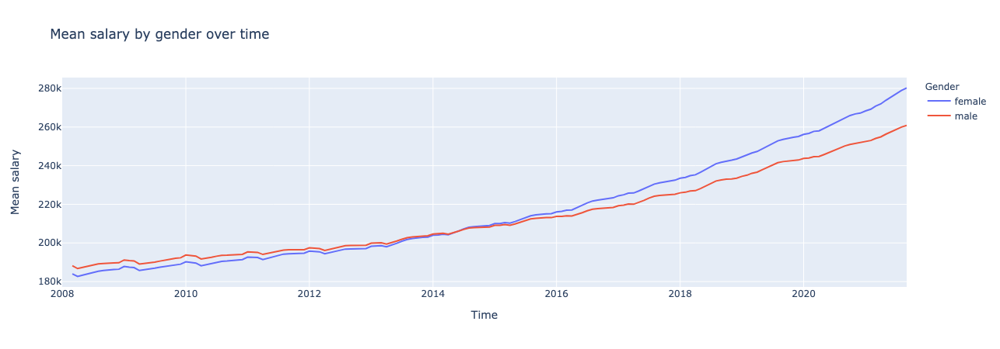

In [82]:
#Plotly Chart for Webpage
t = y.copy()
fig = px.line(t, x=t.index, y=['female','male'], title="Mean salary by gender over time",
              labels={
                     "value": "Mean salary",
                     "variable": "Gender",
                      "month": "Time"
                 },)
fig.update_traces(
    hovertemplate="%{y} mean salary in %{x}."
)
fig.show()
fig.write_html("test//chart2.html")

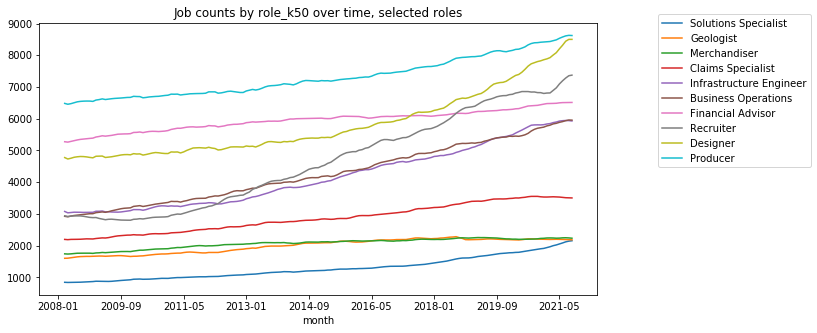

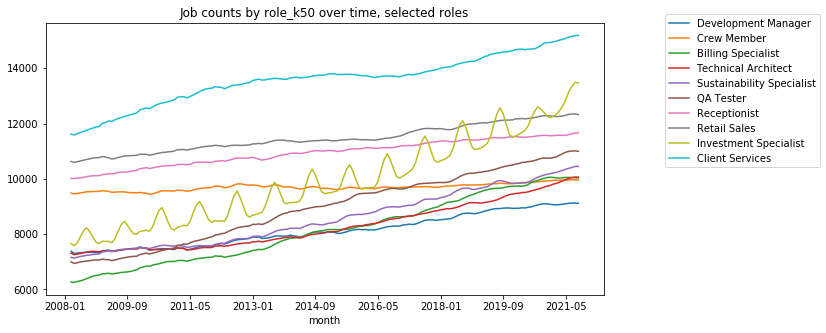

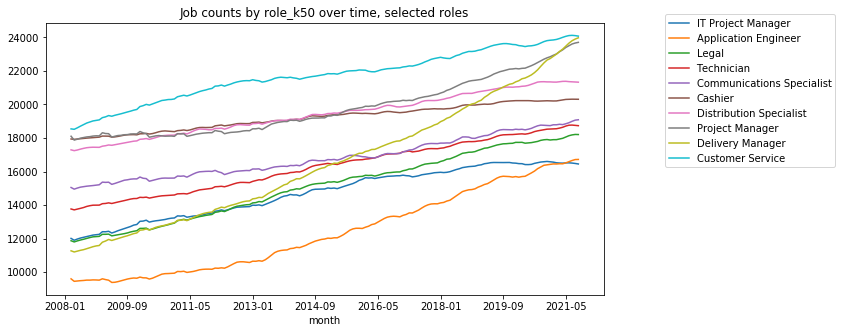

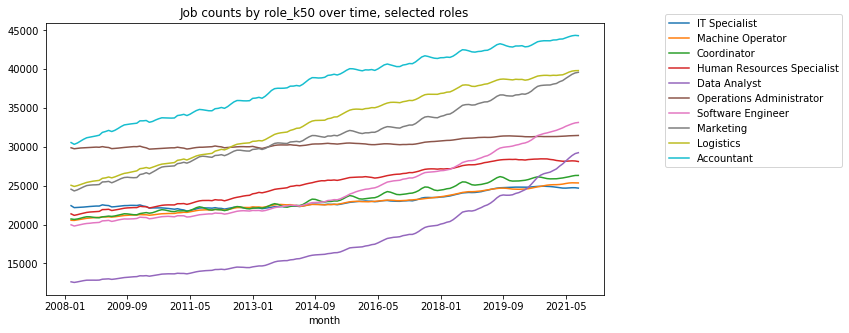

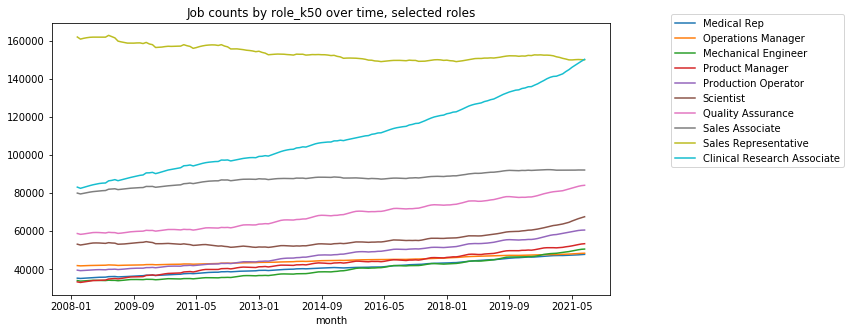

In [52]:
# Job counts by role_k50 over time
y = df.copy()
y = y[y.role_k50 != "empty"]
y = y.groupby(['month','role_k50'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='role_k50',values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
all_cols = list(y.iloc[-1].sort_values().index)
y1 = y[all_cols[:10]]
ax = y1.plot(figsize=(10,5),title="Job counts by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[10:20]]
ax = y1.plot(figsize=(10,5),title="Job counts by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[20:30]]
ax = y1.plot(figsize=(10,5),title="Job counts by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[30:40]]
ax = y1.plot(figsize=(10,5),title="Job counts by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[40:]]
ax = y1.plot(figsize=(10,5),title="Job counts by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))

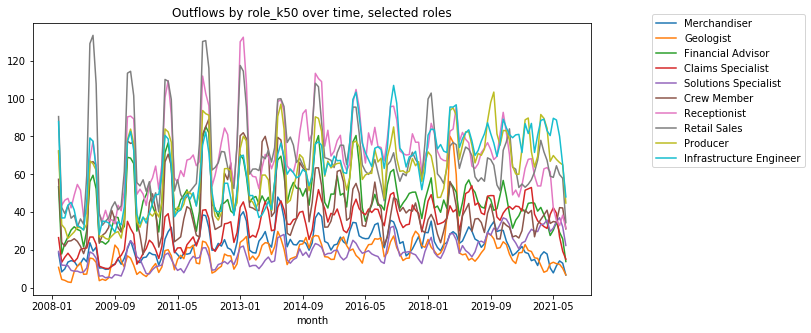

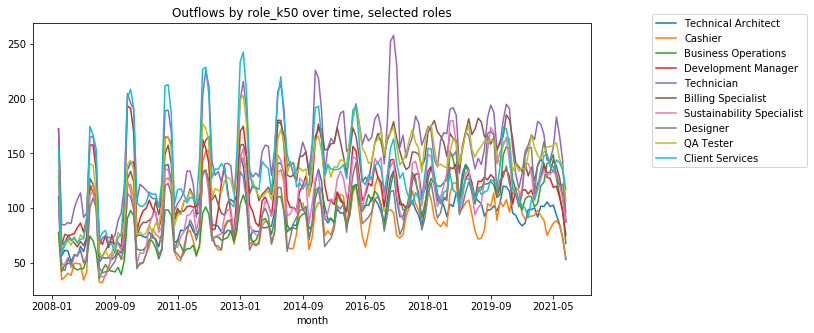

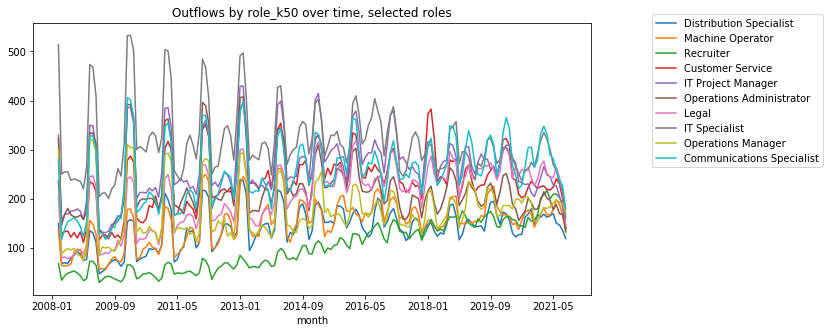

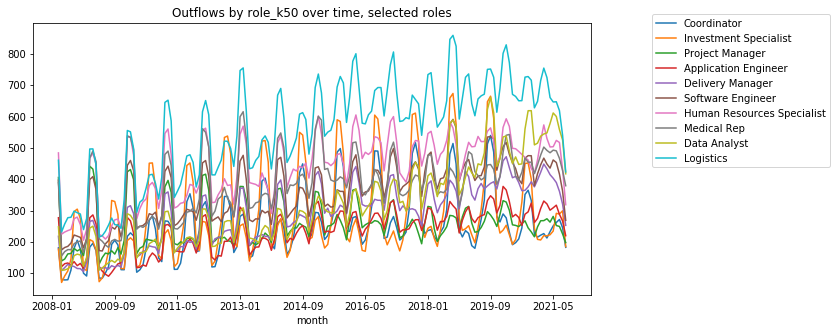

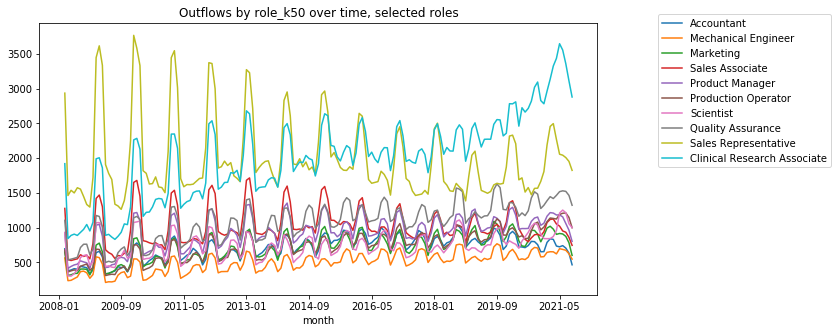

In [53]:
# Outflows by role_k50 over time
y = df.copy()
y = y[y.role_k50 != "empty"]
y = y.groupby(['month','role_k50'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='role_k50',values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve

all_cols = list(y.iloc[-1].sort_values().index)
y1 = y[all_cols[:10]]
ax = y1.plot(figsize=(10,5),title="Outflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[10:20]]
ax = y1.plot(figsize=(10,5),title="Outflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[20:30]]
ax = y1.plot(figsize=(10,5),title="Outflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[30:40]]
ax = y1.plot(figsize=(10,5),title="Outflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[40:]]
ax = y1.plot(figsize=(10,5),title="Outflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))

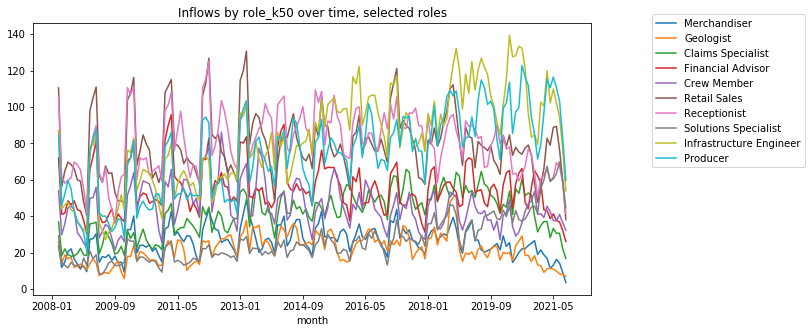

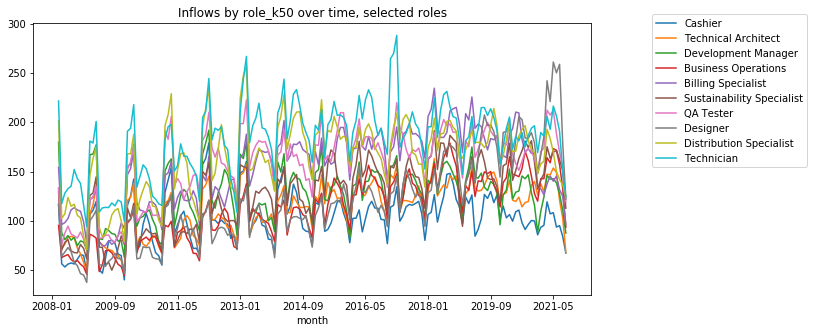

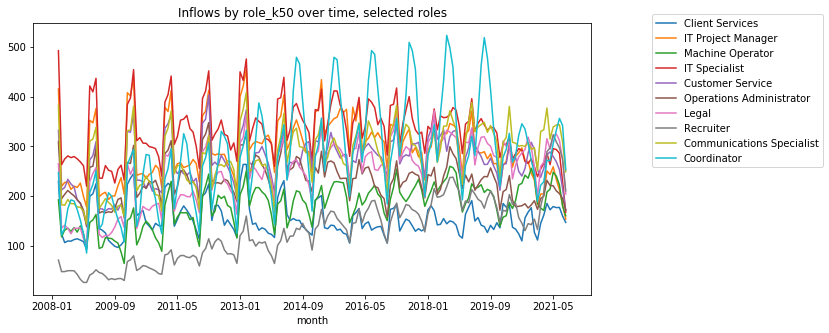

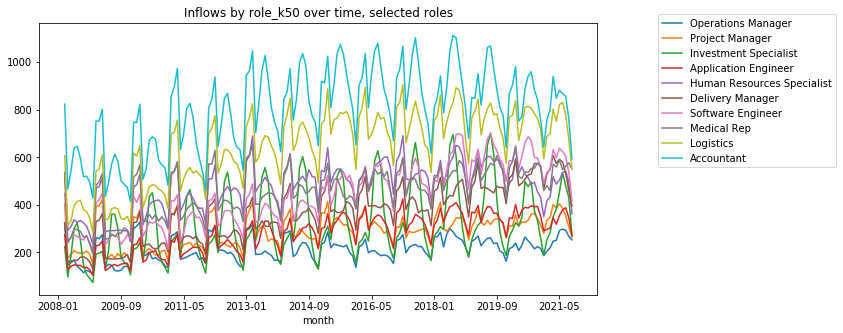

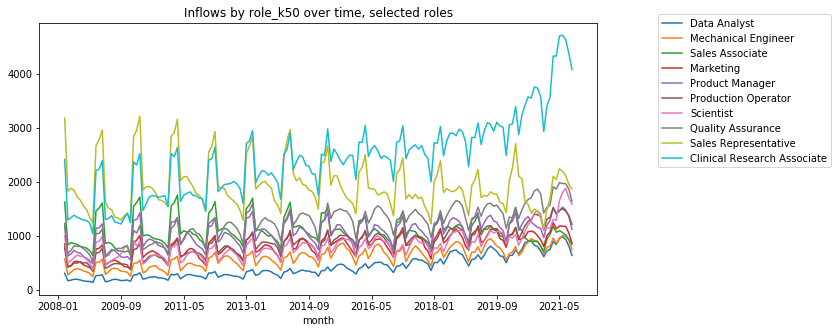

In [54]:
# Inflows by role_k50 over time
y = df.copy()
y = y[y.role_k50 != "empty"]
y = y.groupby(['month','role_k50'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns='role_k50',values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve

all_cols = list(y.iloc[-1].sort_values().index)
y1 = y[all_cols[:10]]
ax = y1.plot(figsize=(10,5),title="Inflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[10:20]]
ax = y1.plot(figsize=(10,5),title="Inflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[20:30]]
ax = y1.plot(figsize=(10,5),title="Inflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[30:40]]
ax = y1.plot(figsize=(10,5),title="Inflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[40:]]
ax = y1.plot(figsize=(10,5),title="Inflows by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))

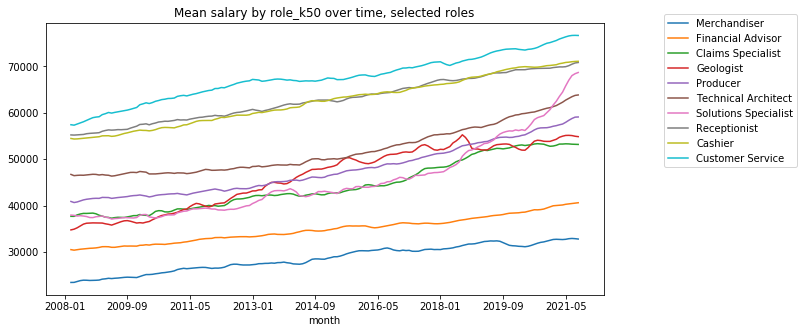

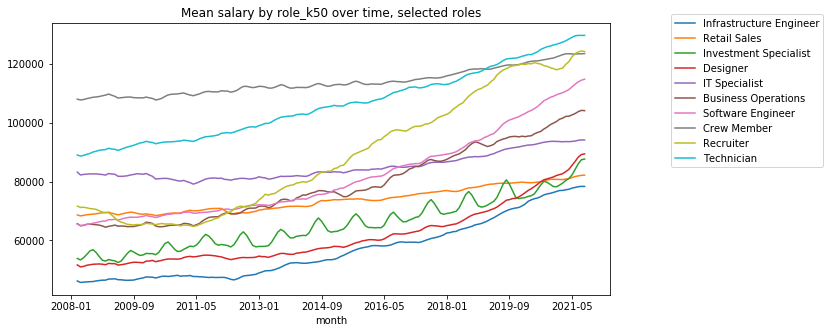

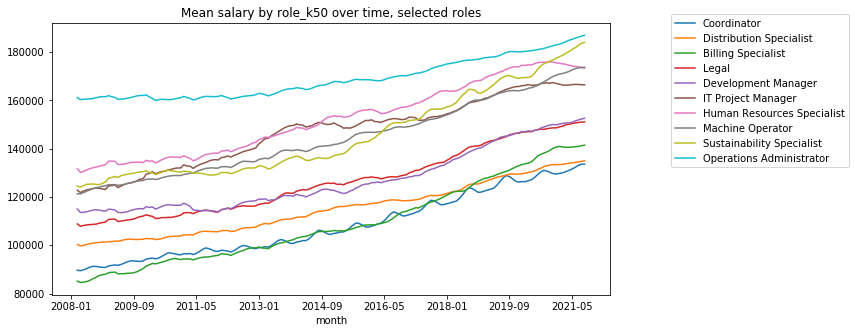

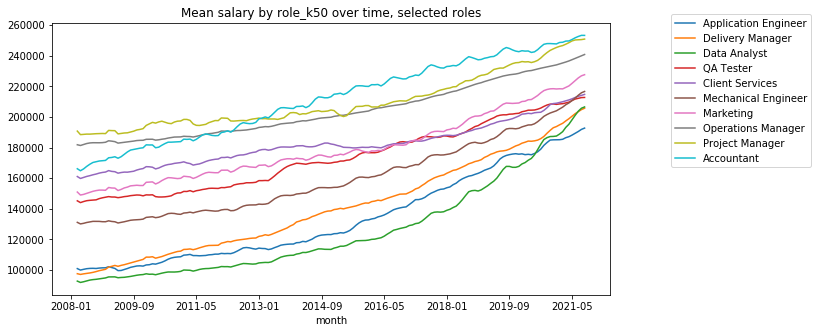

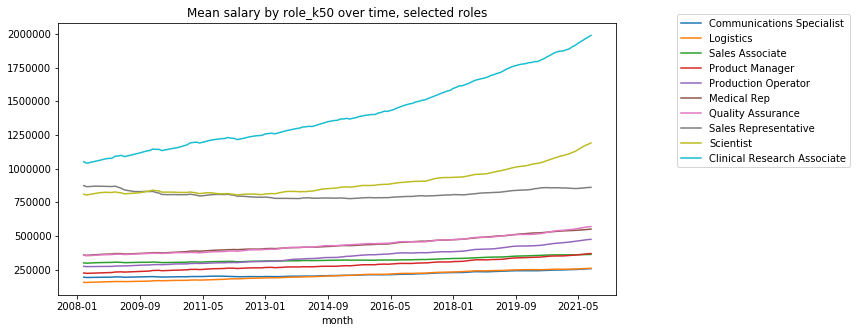

In [55]:
# Mean salary by role_k50 over time
y = df.copy()
y = y[y.role_k50 != "empty"]
y = y.groupby(['month','role_k50'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns='role_k50',values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve

all_cols = list(y.iloc[-1].sort_values().index)
y1 = y[all_cols[:10]]
ax = y1.plot(figsize=(10,5),title="Mean salary by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[10:20]]
ax = y1.plot(figsize=(10,5),title="Mean salary by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[20:30]]
ax = y1.plot(figsize=(10,5),title="Mean salary by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[30:40]]
ax = y1.plot(figsize=(10,5),title="Mean salary by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))
y1 = y[all_cols[40:]]
ax = y1.plot(figsize=(10,5),title="Mean salary by role_k50 over time, selected roles")
ax.legend(bbox_to_anchor=(1.1, 1.05))

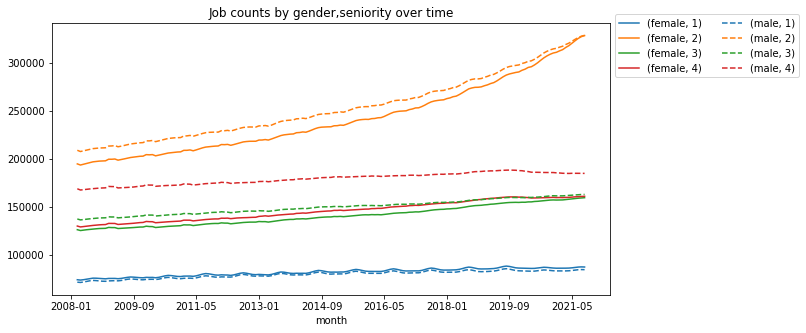

In [83]:
# Job counts by gender,seniority over time
y = df.copy()
y = y.groupby(['month','gender','seniority'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','seniority'],values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job counts by gender,seniority over time",
            style=['-',"-","-","-",'--','--','--','--'],color=[pal[0],pal[1],pal[2],pal[3],pal[0],pal[1],pal[2],pal[3]])
ax.legend(bbox_to_anchor=(1, 1.05),ncol=2)

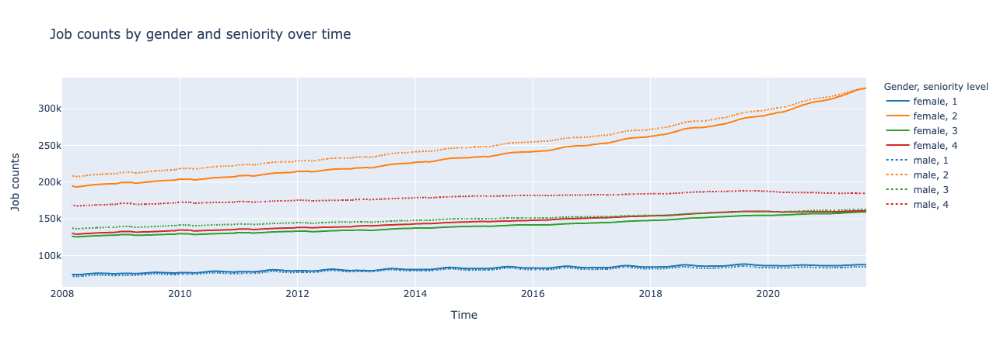

In [84]:
#Plotly chart for webpage
t = y.copy()
t = t.unstack()
t = t.reset_index()
t.columns = ['gender','seniority','month','value']
t['gender_seniority'] = t['gender'] + ", "+ t['seniority'].astype(str)
fig = px.line(t, x='month', y='value', color='gender_seniority',title="Job counts by gender and seniority over time",
              labels={
                     "value": "Job counts",
                     "gender_seniority": "Gender, seniority level",
                      "month": "Time"
                 },)

color_map = px.colors.qualitative.D3
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[0], }}, selector={"legendgroup": "male, 1"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[1], }}, selector={"legendgroup": "male, 2"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[2], }}, selector={"legendgroup": "male, 3"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[3], }}, selector={"legendgroup": "male, 4"})
fig.update_traces(patch={"line": {"color": color_map[0], }}, selector={"legendgroup": "female, 1"})
fig.update_traces(patch={"line": {"color": color_map[1], }}, selector={"legendgroup": "female, 2"})
fig.update_traces(patch={"line": {"color": color_map[2], }}, selector={"legendgroup": "female, 3"})
fig.update_traces(patch={"line": {"color": color_map[3], }}, selector={"legendgroup": "female, 4"})
fig.show()
fig.write_html("test//chart3.html")

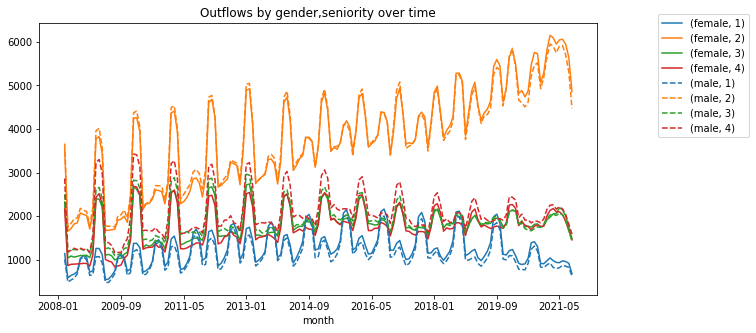

In [58]:
# Outflows by gender,seniority over time
y = df.copy()
y = y.groupby(['month','gender','seniority'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','seniority'],values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by gender,seniority over time",
            style=['-',"-","-","-",'--','--','--','--'],color=[pal[0],pal[1],pal[2],pal[3],pal[0],pal[1],pal[2],pal[3]])
ax.legend(bbox_to_anchor=(1.1, 1.05))

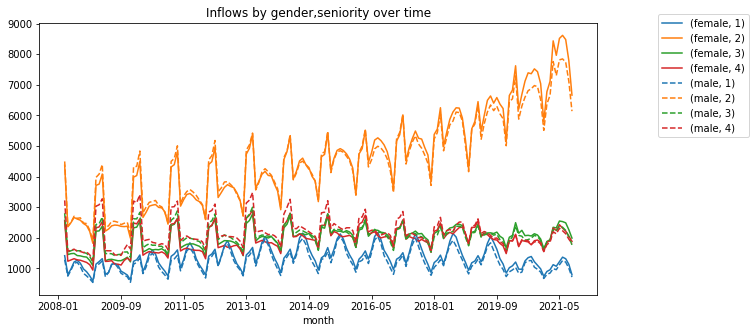

In [59]:
# Inflows by gender,seniority over time
y = df.copy()
y = y.groupby(['month','gender','seniority'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','seniority'],values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by gender,seniority over time",
            style=['-',"-","-","-",'--','--','--','--'],color=[pal[0],pal[1],pal[2],pal[3],pal[0],pal[1],pal[2],pal[3]])
ax.legend(bbox_to_anchor=(1.1, 1.05))

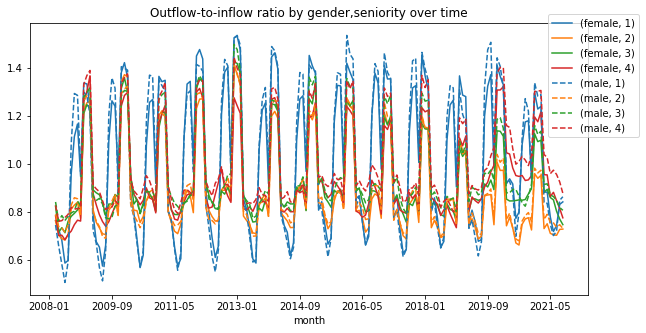

In [61]:
# Outflow-to-inflow ratio by gender,seniority over time
y = df.copy()
y = y.groupby(['month','gender','seniority'])[['outflow','inflow']].sum()
y['outflow_to_inflow'] = y['outflow']/y['inflow']
y = y[['outflow_to_inflow']]
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','seniority'],values='outflow_to_inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflow-to-inflow ratio by gender,seniority over time",
            style=['-',"-","-","-",'--','--','--','--'],color=[pal[0],pal[1],pal[2],pal[3],pal[0],pal[1],pal[2],pal[3]])
ax.legend(bbox_to_anchor=(1.1, 1.05))

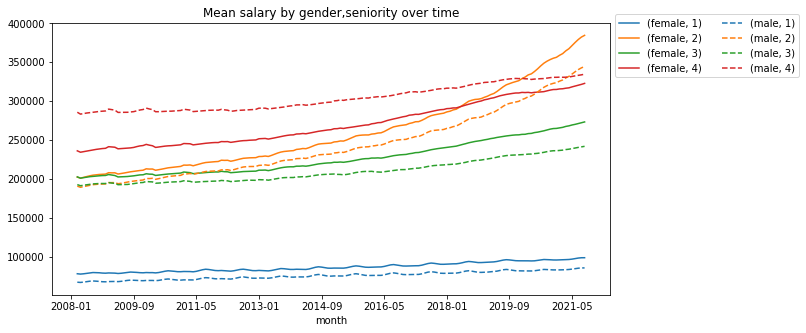

In [69]:
# Mean salary by gender,seniority over time
y = df.copy()
y = y.groupby(['month','gender','seniority'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','seniority'],values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by gender,seniority over time",
            style=['-',"-","-","-",'--','--','--','--'],color=[pal[0],pal[1],pal[2],pal[3],pal[0],pal[1],pal[2],pal[3]])
ax.legend(bbox_to_anchor=(1, 1.05),ncol=2)

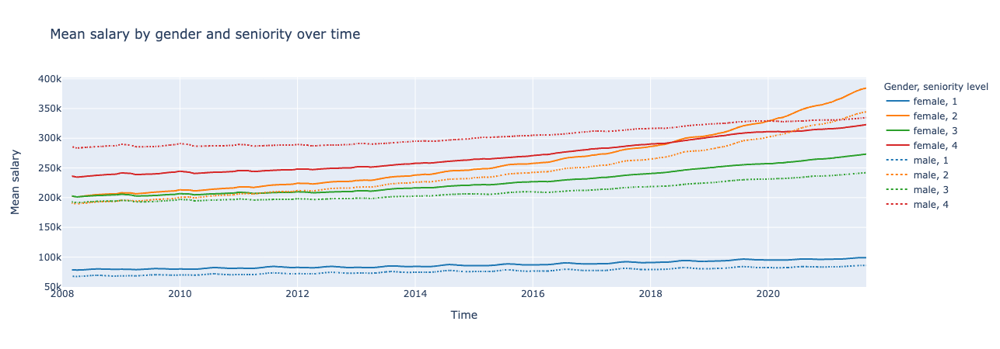

In [70]:
#Plotly chart for webpage
t = y.copy()
t = t.unstack()
t = t.reset_index()
t.columns = ['gender','seniority','month','value']
t['gender_seniority'] = t['gender'] + ", "+ t['seniority'].astype(str)
fig = px.line(t, x='month', y='value', color='gender_seniority',title="Mean salary by gender and seniority over time",
              labels={
                     "value": "Mean salary",
                     "gender_seniority": "Gender, seniority level",
                      "month": "Time"
                 },)

color_map = px.colors.qualitative.D3
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[0], }}, selector={"legendgroup": "male, 1"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[1], }}, selector={"legendgroup": "male, 2"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[2], }}, selector={"legendgroup": "male, 3"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[3], }}, selector={"legendgroup": "male, 4"})
fig.update_traces(patch={"line": {"color": color_map[0], }}, selector={"legendgroup": "female, 1"})
fig.update_traces(patch={"line": {"color": color_map[1], }}, selector={"legendgroup": "female, 2"})
fig.update_traces(patch={"line": {"color": color_map[2], }}, selector={"legendgroup": "female, 3"})
fig.update_traces(patch={"line": {"color": color_map[3], }}, selector={"legendgroup": "female, 4"})
fig.show()
fig.write_html("test//chart4.html")

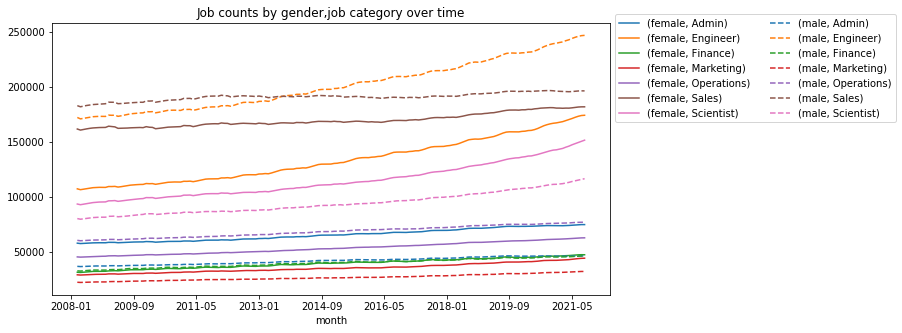

In [72]:
# Job counts by gender,job category over time
y = df.copy()
y = y[y.job_category != 'empty']
y = y.groupby(['month','gender','job_category'])['count'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','job_category'],values='count')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Job counts by gender,job category over time",
            style=['-',"-","-","-","-","-","-",'--','--','--','--','--','--','--'],
            color=[pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],
                   pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],])
ax.legend(bbox_to_anchor=(1, 1.05),ncol=2)

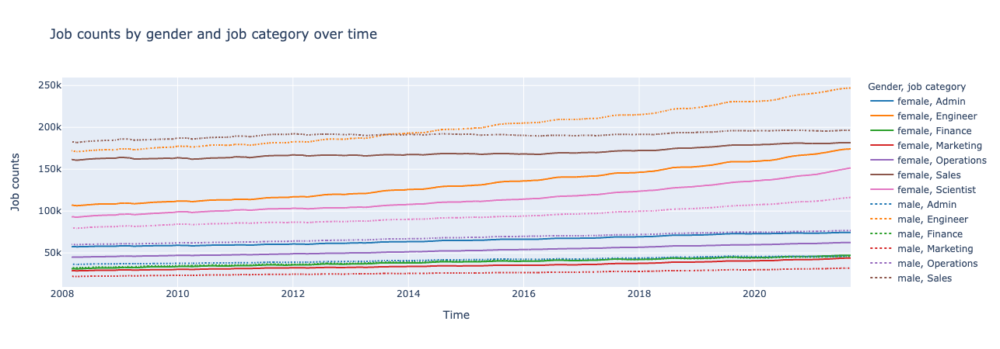

In [75]:
#Plotly chart for webpage
t = y.copy()
t = t.unstack()
t = t.reset_index()
t.columns = ['gender','job_category','month','value']
t['gender_job_category'] = t['gender'] + ", "+ t['job_category'].astype(str)
fig = px.line(t, x='month', y='value', color='gender_job_category',title="Job counts by gender and job category over time",
              labels={
                     "value": "Job counts",
                     "gender_job_category": "Gender, job category",
                      "month": "Time"
                 },)

color_map = px.colors.qualitative.D3
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[0], }}, selector={"legendgroup": "male, Admin"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[1], }}, selector={"legendgroup": "male, Engineer"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[2], }}, selector={"legendgroup": "male, Finance"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[3], }}, selector={"legendgroup": "male, Marketing"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[4], }}, selector={"legendgroup": "male, Operations"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[5], }}, selector={"legendgroup": "male, Sales"})
fig.update_traces(patch={"line": {"dash": 'dot',"color": color_map[6], }}, selector={"legendgroup": "male, Scientist"})
fig.update_traces(patch={"line": {"color": color_map[0], }}, selector={"legendgroup": "female, Admin"})
fig.update_traces(patch={"line": {"color": color_map[1], }}, selector={"legendgroup": "female, Engineer"})
fig.update_traces(patch={"line": {"color": color_map[2], }}, selector={"legendgroup": "female, Finance"})
fig.update_traces(patch={"line": {"color": color_map[3], }}, selector={"legendgroup": "female, Marketing"})
fig.update_traces(patch={"line": {"color": color_map[4], }}, selector={"legendgroup": "female, Operations"})
fig.update_traces(patch={"line": {"color": color_map[5], }}, selector={"legendgroup": "female, Sales"})
fig.update_traces(patch={"line": {"color": color_map[6], }}, selector={"legendgroup": "female, Scientist"})
fig.show()
fig.write_html("test//chart5.html")

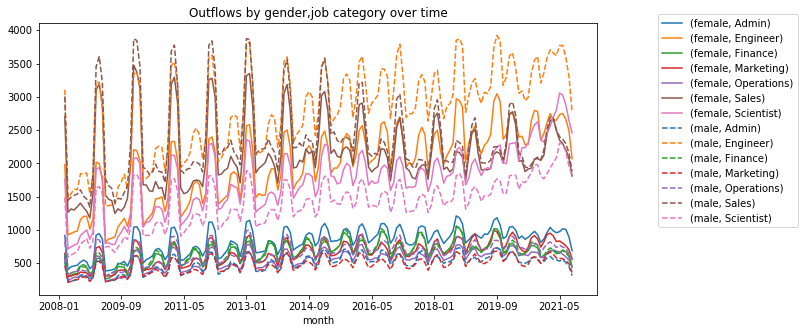

In [76]:
# Outflows by gender,job category over time
y = df.copy()
y = y[y.job_category != 'empty']
y = y.groupby(['month','gender','job_category'])['outflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','job_category'],values='outflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Outflows by gender,job category over time",
            style=['-',"-","-","-","-","-","-",'--','--','--','--','--','--','--'],
            color=[pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],
                   pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],])
ax.legend(bbox_to_anchor=(1.1, 1.05))

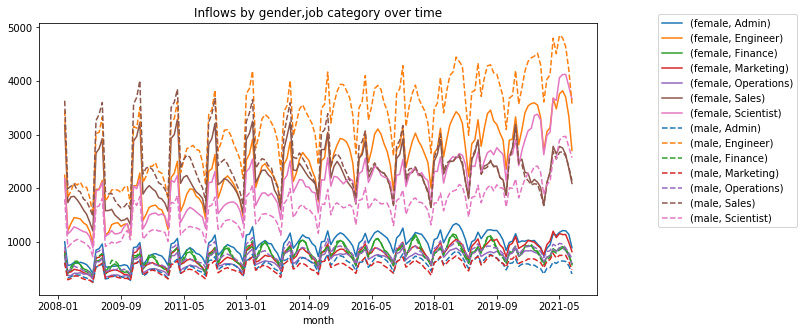

In [77]:
# Inflows by gender,job category over time
y = df.copy()
y = y[y.job_category != 'empty']
y = y.groupby(['month','gender','job_category'])['inflow'].sum()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','job_category'],values='inflow')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Inflows by gender,job category over time",
            style=['-',"-","-","-","-","-","-",'--','--','--','--','--','--','--'],
            color=[pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],
                   pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],])
ax.legend(bbox_to_anchor=(1.1, 1.05))

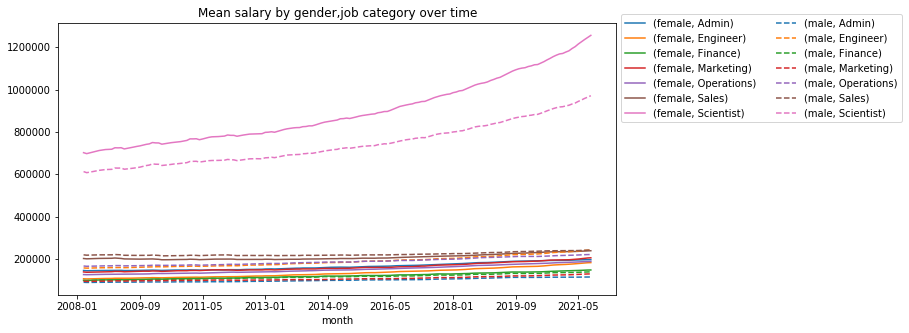

In [78]:
# Mean salary by gender,job category over time
y = df.copy()
y = y[y.job_category != 'empty']
y = y.groupby(['month','gender','job_category'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','job_category'],values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by gender,job category over time",
            style=['-',"-","-","-","-","-","-",'--','--','--','--','--','--','--'],
            color=[pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],
                   pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],pal[6],])
ax.legend(bbox_to_anchor=(1, 1.05),ncol=2)

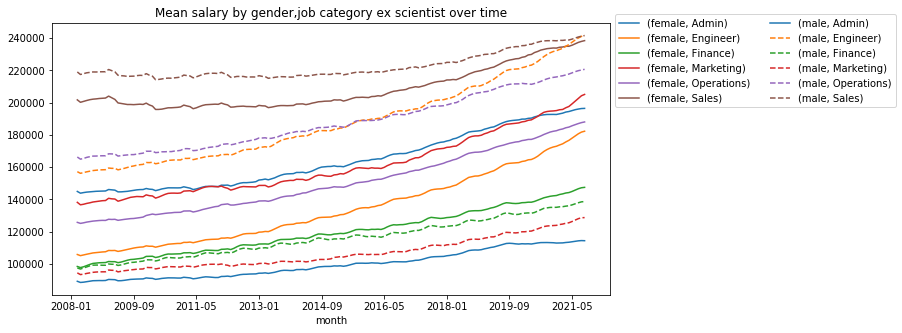

In [79]:
# Mean salary by gender,job category ex scientist over time
y = df.copy()
y = y[y.job_category != 'empty']
y = y[y.job_category != 'Scientist']
y = y.groupby(['month','gender','job_category'])['salary'].mean()
y = y.reset_index()
y = y.pivot_table(index='month',columns=['gender','job_category'],values='salary')
y = y.rolling(3).mean() #3-months moving average to smoothen out the curve
ax = y.plot(figsize=(10,5),title="Mean salary by gender,job category ex scientist over time",
            style=['-',"-","-","-","-","-","-",'--','--','--','--','--','--','--'],
            color=[pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],
                   pal[0],pal[1],pal[2],pal[3],pal[4],pal[5],])
ax.legend(bbox_to_anchor=(1, 1.05),ncol=2)

In [78]:
# Now making heatmaps

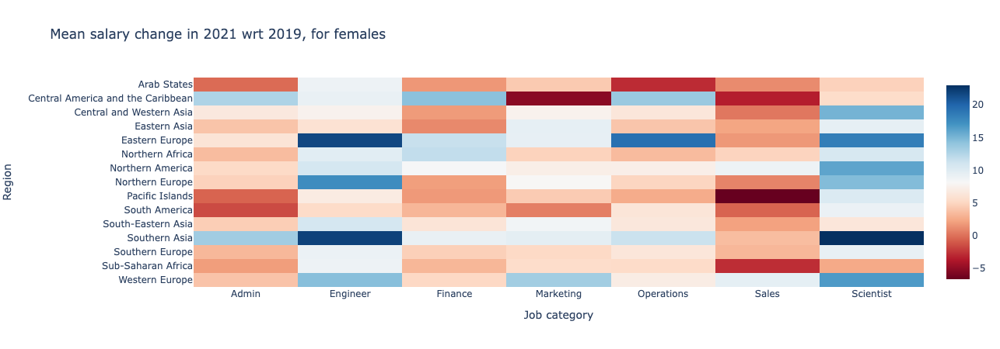

In [89]:
# Heatmap of mean salary with region & job_category
x = df.copy()
x = x[x.job_category != 'empty']
x = x[x.region != 'empty']
x = x[x.gender == 'female']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['job_category','region'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='region',columns='job_category',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['job_category','region'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='region',columns='job_category',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Job category'
x_final.index.name = 'Region'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019, for females")
fig.update_traces(
    hovertemplate="</br>In '%{y}', the mean salary for '%{x}' job category changed by %{z}% for females.</br>"
)
fig.show()
fig.write_html("test//chart6.html")

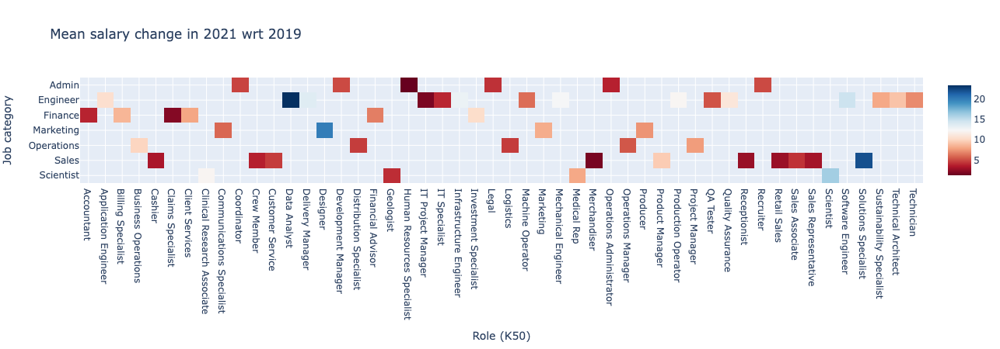

In [80]:
# Heatmap of mean salary with role_k50 & job_category
x = df.copy()
x = x[x.job_category != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['job_category','role_k50'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='role_k50',columns='job_category',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['job_category','role_k50'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='role_k50',columns='job_category',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Job category'
x_final.index.name = 'Role (K50)'

fig = px.imshow(x_final.T, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>In '%{y}' job category, the mean salary for '%{x}' role changed by %{z}%.</br>"
)
fig.show()

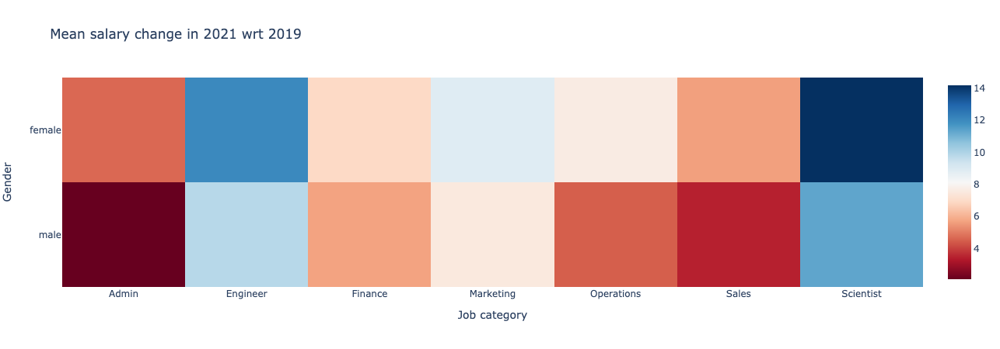

In [90]:
# Heatmap of mean salary with gender & job_category
x = df.copy()
x = x[x.job_category != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['job_category','gender'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='gender',columns='job_category',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['job_category','gender'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='gender',columns='job_category',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Job category'
x_final.index.name = 'Gender'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>In '%{x}' job category, the mean salary for '%{y}' gender changed by %{z}%.</br>"
)
fig.show()
# fig.write_html("test//chart6.html")

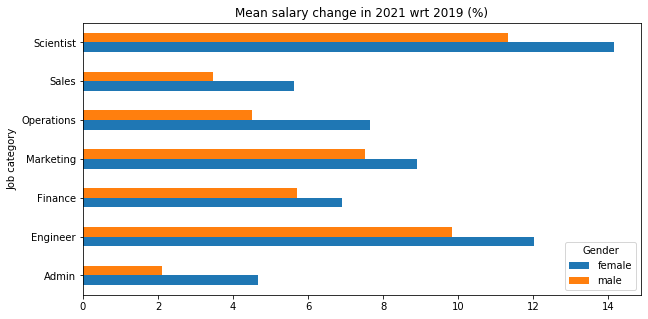

In [144]:
x_final.T.plot.barh(figsize=(10,5),title="Mean salary change in 2021 wrt 2019 (%)")

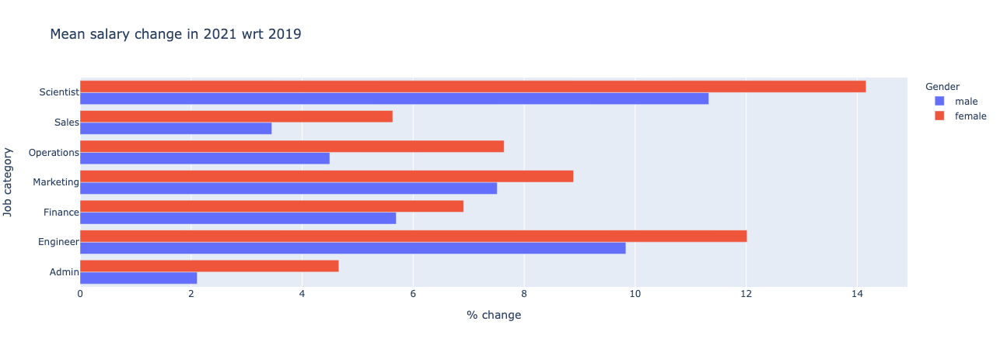

In [91]:
t = x_final.T.reset_index()
fig = px.bar(t, x=["male","female"], y="Job category", orientation='h',                 
             labels={
                     "value": "% change",
                     "variable": "Gender",
                 },
                title="Mean salary change in 2021 wrt 2019")
fig.update_layout(barmode='group')
fig.update_traces(
    hovertemplate="Change of '%{x}%' in '%{y}' job category."
)
fig.show()
fig.write_html("test//chart7.html")

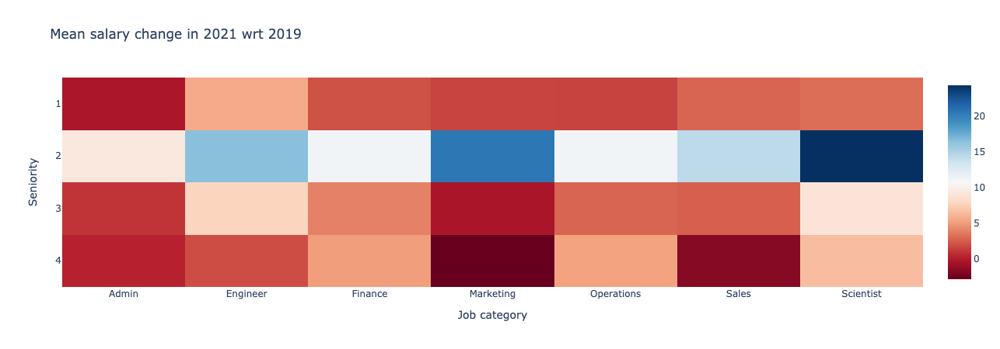

In [82]:
# Heatmap of mean salary with seniority & job_category
x = df.copy()
x = x[x.job_category != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['job_category','seniority'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='seniority',columns='job_category',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['job_category','seniority'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='seniority',columns='job_category',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Job category'
x_final.index.name = 'Seniority'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>In '%{x}' job category, the mean salary for level '%{y}' seniority changed by %{z}%.</br>"
)
fig.show()

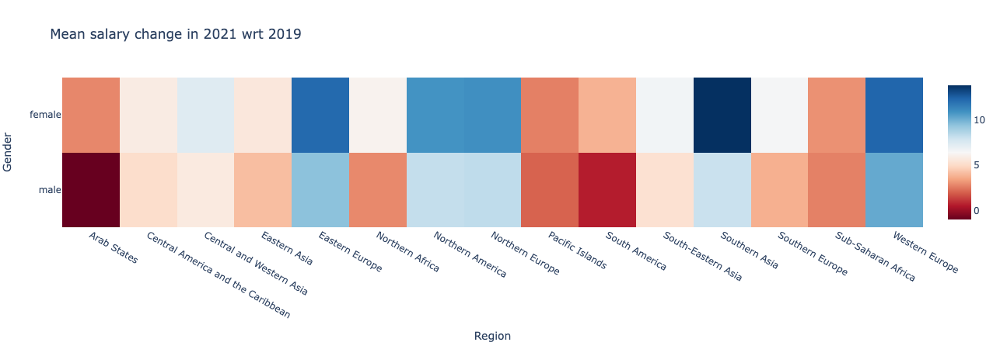

In [145]:
# Heatmap of mean salary with gender & region
x = df.copy()
x = x[x.region != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['region','gender'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='gender',columns='region',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['region','gender'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='gender',columns='region',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Region'
x_final.index.name = 'Gender'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>In '%{x}' region, the mean salary for '%{y}' gender changed by %{z}%.</br>"
)
fig.show()

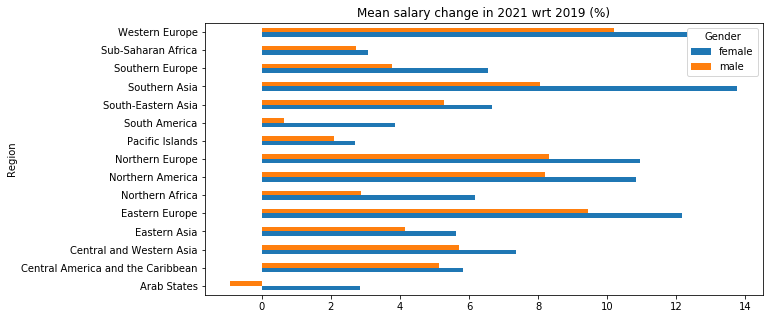

In [146]:
x_final.T.plot.barh(figsize=(10,5),title="Mean salary change in 2021 wrt 2019 (%)")

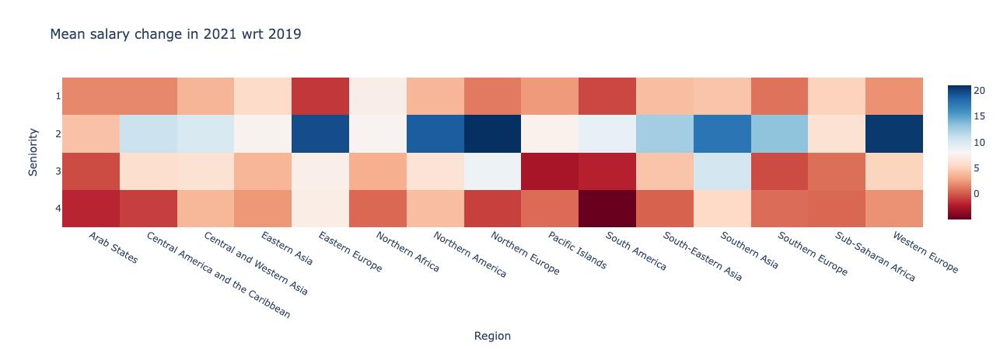

In [84]:
# Heatmap of mean salary with seniority & region
x = df.copy()
x = x[x.region != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['region','seniority'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='seniority',columns='region',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['region','seniority'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='seniority',columns='region',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Region'
x_final.index.name = 'Seniority'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>In '%{x}' region, the mean salary for level '%{y}' seniority changed by %{z}%.</br>"
)
fig.show()

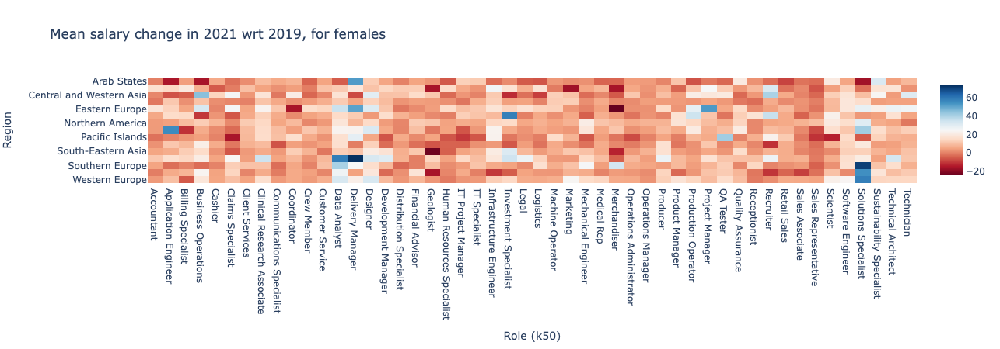

In [94]:
# Heatmap of mean salary with role_k50 & region
x = df.copy()
x = x[x.region != 'empty']
x = x[x.role_k50 != 'empty']
x = x[x.gender == 'female']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['region','role_k50'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='role_k50',columns='region',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['region','role_k50'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='role_k50',columns='region',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Region'
x_final.index.name = 'Role (k50)'

fig = px.imshow(x_final.T, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019, for females")
fig.update_traces(
    hovertemplate="</br>In '%{x}' region, the mean salary for '%{y}' role changed by %{z}% for females.</br>"
)
fig.show()
# fig.write_html("test//chart8.html")

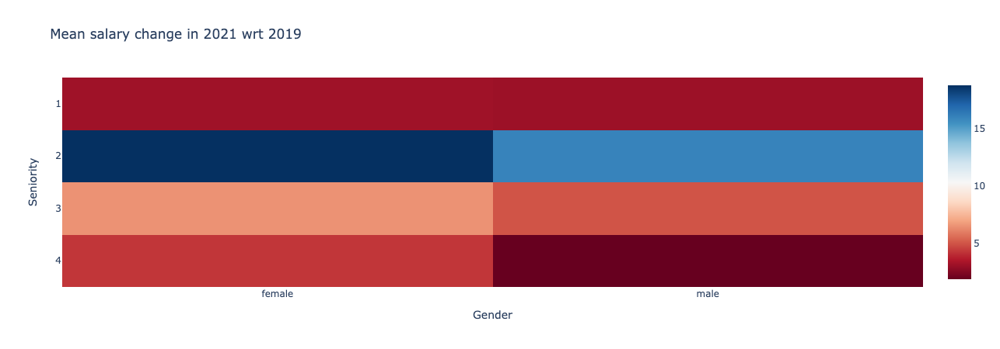

In [95]:
# Heatmap of mean salary with gender & seniority
x = df.copy()

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','seniority'])['salary'].mean().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='seniority',columns='gender',values='salary')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['gender','seniority'])['salary'].mean().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='seniority',columns='gender',values='salary')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Seniority'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Mean salary change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>For '%{x}' candidates, the mean salary at level '%{y}' seniority changed by %{z}%.</br>"
)
fig.show()

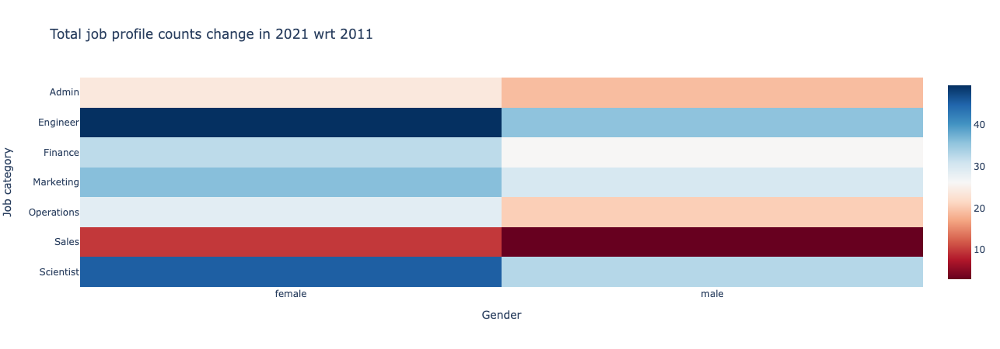

In [151]:
# Heatmap of total job postings with gender & job_category
x = df.copy()
x= x[x.job_category != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','job_category'])['count'].sum().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='job_category',columns='gender',values='count')

x_2011 = x[x.year ==2011].copy()
x_2011 = x_2011[x_2011.month_.isin(available_months)]
x_2011 = x_2011.groupby(['gender','job_category'])['count'].sum().to_frame().reset_index()
x_2011 = x_2011.pivot_table(index='job_category',columns='gender',values='count')

x_final = ((x_2021-x_2011)/x_2011)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Job category'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Total job profile counts change in 2021 wrt 2011")
fig.update_traces(
    hovertemplate="</br>For '%{x}' candidates, the job profile counts at '%{y}' job category changed by %{z}%.</br>"
)
fig.show()

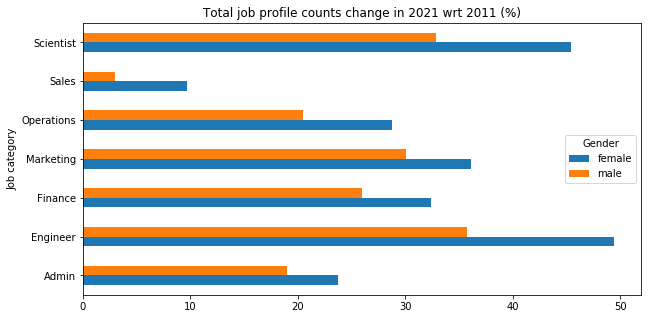

In [154]:
x_final.plot.barh(figsize=(10,5),title="Total job profile counts change in 2021 wrt 2011 (%)")

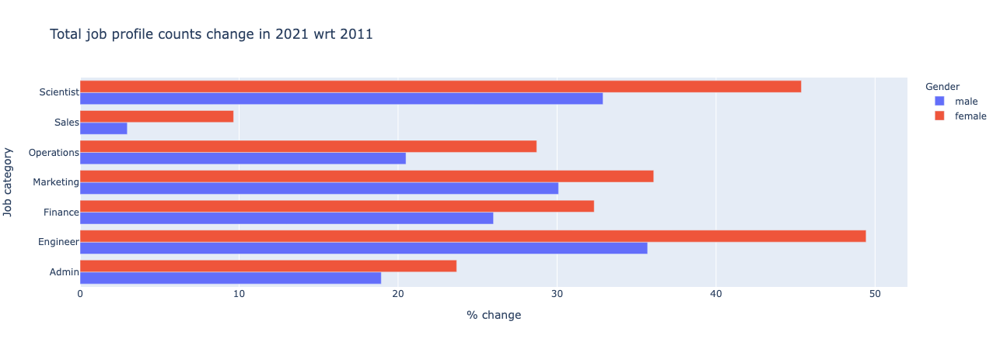

In [158]:
t = x_final.reset_index()
fig = px.bar(t, x=["male","female"], y="Job category", orientation='h',                 
             labels={
                     "value": "% change",
                     "variable": "Gender",
                 },
                title="Total job profile counts change in 2021 wrt 2011")
fig.update_layout(barmode='group')
fig.update_traces(
    hovertemplate="Change of '%{x}%' in '%{y}' job category."
)
fig.show()

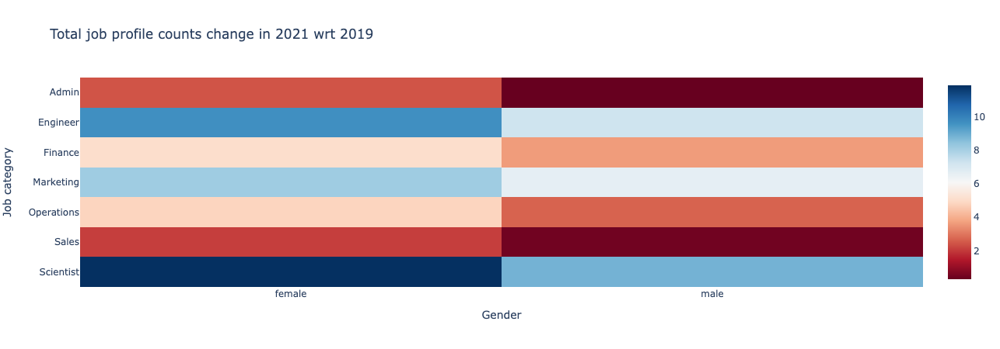

In [159]:
# Heatmap of total job postings with gender & job_category
x = df.copy()
x= x[x.job_category != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','job_category'])['count'].sum().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='job_category',columns='gender',values='count')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['gender','job_category'])['count'].sum().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='job_category',columns='gender',values='count')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Job category'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Total job profile counts change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>For '%{x}' candidates, the job profile counts at '%{y}' job category changed by %{z}%.</br>"
)
fig.show()

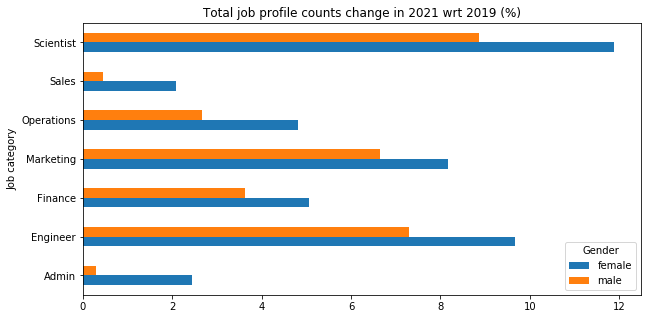

In [160]:
x_final.plot.barh(figsize=(10,5),title="Total job profile counts change in 2021 wrt 2019 (%)")

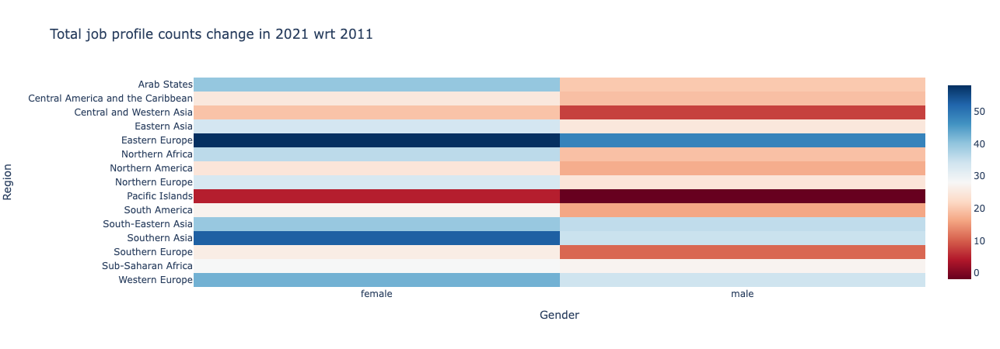

In [161]:
# Heatmap of total job postings with gender & region
x = df.copy()
x= x[x.job_category != 'empty']
x= x[x.region != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','region'])['count'].sum().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='region',columns='gender',values='count')

x_2011 = x[x.year ==2011].copy()
x_2011 = x_2011[x_2011.month_.isin(available_months)]
x_2011 = x_2011.groupby(['gender','region'])['count'].sum().to_frame().reset_index()
x_2011 = x_2011.pivot_table(index='region',columns='gender',values='count')

x_final = ((x_2021-x_2011)/x_2011)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Region'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Total job profile counts change in 2021 wrt 2011")
fig.update_traces(
    hovertemplate="</br>For '%{x}' candidates, the job profile counts at '%{y}' region changed by %{z}%.</br>"
)
fig.show()

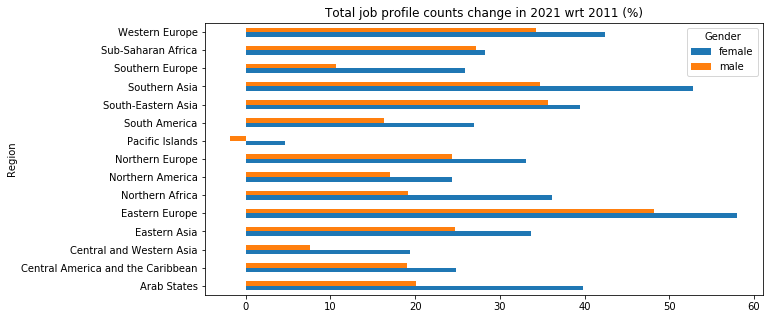

In [162]:
x_final.plot.barh(figsize=(10,5),title="Total job profile counts change in 2021 wrt 2011 (%)")

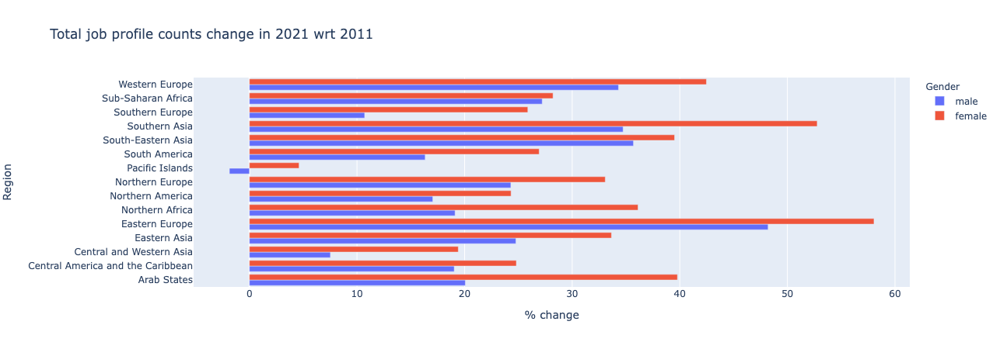

In [163]:
t = x_final.reset_index()
fig = px.bar(t, x=["male","female"], y="Region", orientation='h',                 
             labels={
                     "value": "% change",
                     "variable": "Gender",
                 },
                title="Total job profile counts change in 2021 wrt 2011")
fig.update_layout(barmode='group')
fig.update_traces(
    hovertemplate="Change of '%{x}%' in '%{y}' region."
)
fig.show()


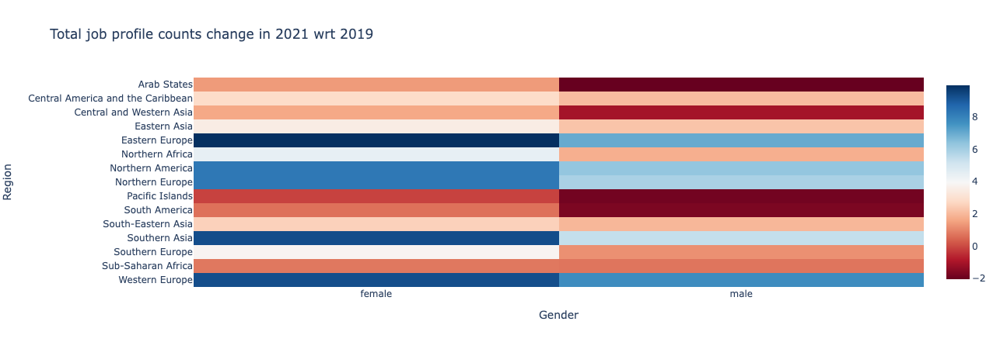

In [164]:
# Heatmap of total job postings with gender & region
x = df.copy()
x= x[x.job_category != 'empty']
x= x[x.region != 'empty']

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','region'])['count'].sum().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='region',columns='gender',values='count')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['gender','region'])['count'].sum().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='region',columns='gender',values='count')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Region'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Total job profile counts change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>For '%{x}' candidates, the job profile counts at '%{y}' region changed by %{z}%.</br>"
)
fig.show()

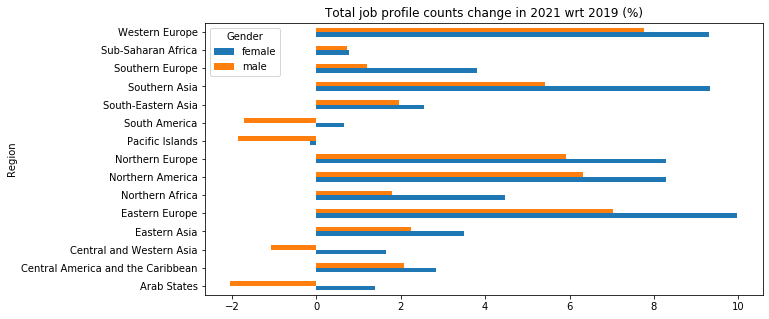

In [165]:
x_final.plot.barh(figsize=(10,5),title="Total job profile counts change in 2021 wrt 2019 (%)")

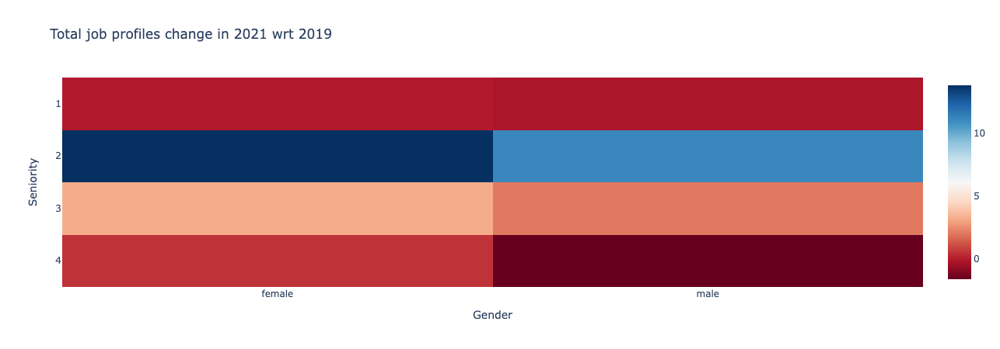

In [99]:
# Heatmap of total job postings with gender & seniority
x = df.copy()

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','seniority'])['count'].sum().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='seniority',columns='gender',values='count')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['gender','seniority'])['count'].sum().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='seniority',columns='gender',values='count')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Seniority'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Total job profiles change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>For '%{x}' candidates, the job postings at level '%{y}' seniority changed by %{z}%.</br>"
)
fig.show()

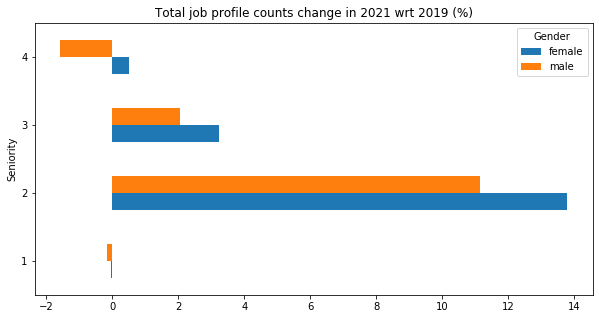

In [100]:
x_final.plot.barh(figsize=(10,5),title="Total job profile counts change in 2021 wrt 2019 (%)")

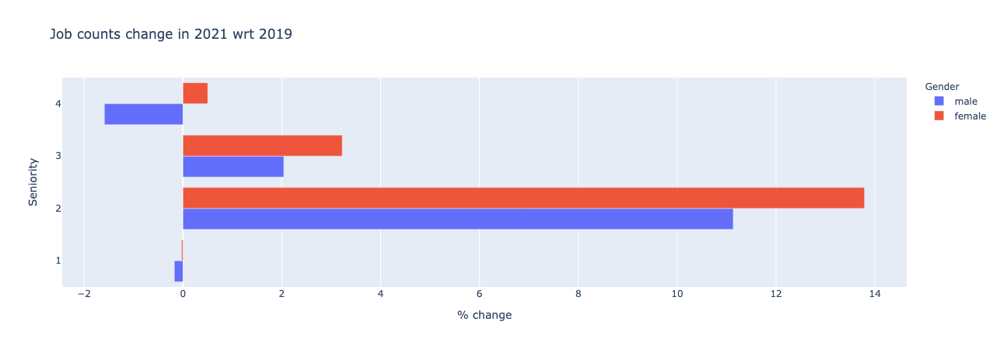

In [103]:
t = x_final.reset_index()
fig = px.bar(t, x=["male","female"], y="Seniority", orientation='h',                 
             labels={
                     "value": "% change",
                     "variable": "Gender",
                 },
                title="Job counts change in 2021 wrt 2019")
fig.update_layout(barmode='group')
fig.update_traces(
    hovertemplate="Change of '%{x}%' for level '%{y}' seniority."
)
fig.show()
fig.write_html("test//chart9.html")

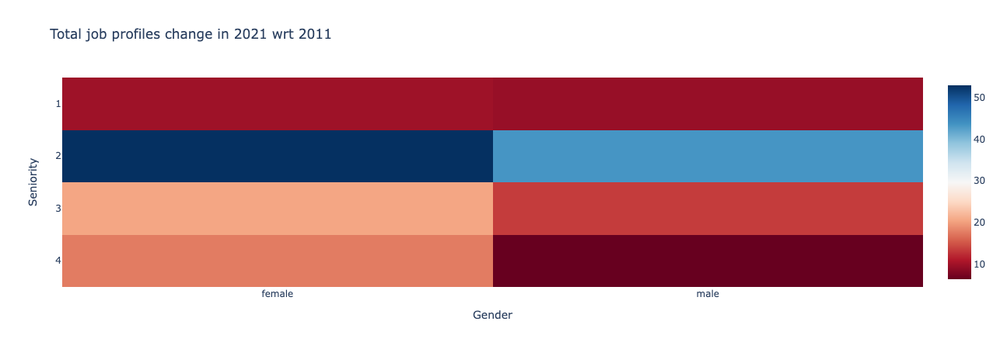

In [166]:
# Heatmap of total job postings with gender & seniority
x = df.copy()

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','seniority'])['count'].sum().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='seniority',columns='gender',values='count')

x_2011 = x[x.year ==2011].copy()
x_2011 = x_2011[x_2011.month_.isin(available_months)]
x_2011 = x_2011.groupby(['gender','seniority'])['count'].sum().to_frame().reset_index()
x_2011 = x_2011.pivot_table(index='seniority',columns='gender',values='count')

x_final = ((x_2021-x_2011)/x_2011)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Seniority'

fig = px.imshow(x_final, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Total job profiles change in 2021 wrt 2011")
fig.update_traces(
    hovertemplate="</br>For '%{x}' candidates, the job postings at level '%{y}' seniority changed by %{z}%.</br>"
)
fig.show()

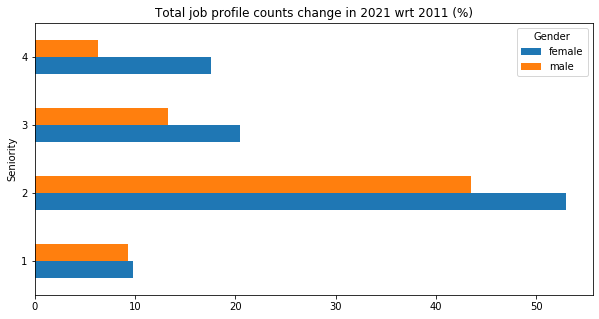

In [167]:
x_final.plot.barh(figsize=(10,5),title="Total job profile counts change in 2021 wrt 2011 (%)")

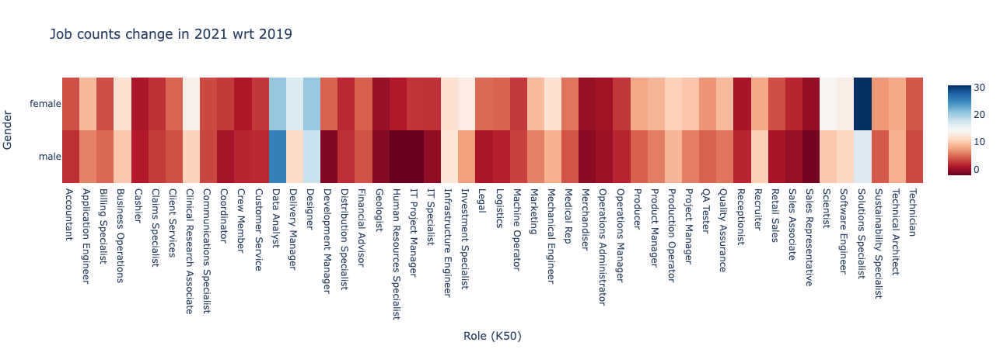

In [106]:
# Heatmap of total job postings with gender & role_k50
x = df.copy()

x.month = pd.to_datetime(x.month)
x['year'] = x.month.dt.year
x['month_'] = x.month.dt.month
x = x[x.role_k50 != 'empty']

x_2021 = x[x.year ==2021].copy()
available_months = list(x_2021.month_.unique())
x_2021 = x_2021.groupby(['gender','role_k50'])['count'].sum().to_frame().reset_index()
x_2021 = x_2021.pivot_table(index='role_k50',columns='gender',values='count')

x_2019 = x[x.year ==2019].copy()
x_2019 = x_2019[x_2019.month_.isin(available_months)]
x_2019 = x_2019.groupby(['gender','role_k50'])['count'].sum().to_frame().reset_index()
x_2019 = x_2019.pivot_table(index='role_k50',columns='gender',values='count')

x_final = ((x_2021-x_2019)/x_2019)*100
x_final.columns.name = 'Gender'
x_final.index.name = 'Role (K50)'

fig = px.imshow(x_final.T, aspect="auto", color_continuous_scale=px.colors.sequential.RdBu, title="Job counts change in 2021 wrt 2019")
fig.update_traces(
    hovertemplate="</br>For '%{y}' candidates, the job counts for '%{x}' role changed by %{z}%.</br>"
)
fig.show()
fig.write_html("test//chart10.html")

In [115]:
#Chart1 - Racing barchart - Regionwise cumulative count
x1 = df.copy()
x1 = x1[x1.region != 'empty']
x1 = x1.groupby(['month','region','gender'])['count'].sum().to_frame().reset_index()
x1 = x1.pivot_table(index=['region','gender'],columns='month',values='count')
x1 = x1.reset_index()
x1.to_csv('test//bar_race.csv')
#Racing bar chart created using flourish